# 1 Introduction

In this EDA, we'll take a high-level look at the tabular data and image data, and then dive into some deeper exploration where we examine the statistical characteristics of our tabular features, and try to gain a basic understanding some of the more domain-specific features in the dataset. The overall goal here is to try and discover any key observations that may assist with the competition classification task.

# 1.1 - First Impressions

Let's load up the data and take a very general look at the dataset to get a 10,000 foot view of our features and number of training samples to work with.

In [1]:
!pip install -qU python-gdcm pydicom pylibjpeg

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc

from cv2 import resize
from numpy import amax, uint8
from pathlib import Path
from pydicom import dcmread
from pydicom.pixel_data_handlers.util import apply_voi_lut as avl
from skimage import exposure as ex
from collections import defaultdict
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

train = pd.read_csv("../../datasets/train.csv")
test = pd.read_csv("../../datasets/test.csv")

train

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case
0,2,10006,462822612,L,CC,61.0,0,0,0,NaN,0,NaN,29,False
1,2,10006,1459541791,L,MLO,61.0,0,0,0,NaN,0,NaN,29,False
2,2,10006,1864590858,R,MLO,61.0,0,0,0,NaN,0,NaN,29,False
3,2,10006,1874946579,R,CC,61.0,0,0,0,NaN,0,NaN,29,False
4,2,10011,220375232,L,CC,55.0,0,0,0,0.0,0,NaN,21,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54701,1,9973,1729524723,R,MLO,43.0,0,0,0,1.0,0,C,49,False
54702,1,9989,63473691,L,MLO,60.0,0,0,0,NaN,0,C,216,False
54703,1,9989,1078943060,L,CC,60.0,0,0,0,NaN,0,C,216,False
54704,1,9989,398038886,R,MLO,60.0,0,0,0,0.0,0,C,216,True


In [10]:
test

,site_id,patient_id,image_id,laterality,view,age,implant,machine_id,prediction_id
0,2,10008,736471439,L,MLO,81,0,21,10008_L
1,2,10008,1591370361,L,CC,81,0,21,10008_L
2,2,10008,68070693,R,MLO,81,0,21,10008_R
3,2,10008,361203119,R,CC,81,0,21,10008_R


In [11]:
print("-- Training data --")
print(": Train set shape           = {:,d} rows x {:d} columns".format(train.shape[0], train.shape[1]))
print(": Number of unique images   = {:,d}".format(train["image_id"].nunique()))
print(": Number of unique patients = {:,d}".format(train["patient_id"].nunique()))
print(": Number of unique views    = {:d}".format(train["view"].nunique()))
print(": Number of unique sites    = {:d}".format(train["site_id"].nunique()))
print(": Number of unique machines = {:,d}".format(train["machine_id"].nunique()))
print()
print("-- Testing data --")
print(": Test  set shape           = {:,d} rows x {:d} columns".format(test.shape[0], test.shape[1]))
print(": Number of unique images   = {:,d}".format(test["image_id"].nunique()))
print(": Number of unique patients = {:,d}".format(test["patient_id"].nunique()))
print(": Number of unique views    = {:d}".format(test["view"].nunique()))
print(": Number of unique sites    = {:d}".format(test["site_id"].nunique()))
print(": Number of unique machines = {:,d}".format(test["machine_id"].nunique()))

-- Training data --
: Train set shape           = 54,706 rows x 14 columns
: Number of unique images   = 54,706
: Number of unique patients = 11,913
: Number of unique views    = 6
: Number of unique sites    = 2
: Number of unique machines = 10

-- Testing data --
: Test  set shape           = 4 rows x 9 columns
: Number of unique images   = 4
: Number of unique patients = 1
: Number of unique views    = 2
: Number of unique sites    = 1
: Number of unique machines = 1


Breaking this down a little:

* There are 54,706 training samples to work with, each containing 14 features.
    * There are only 2 different sites where imaging took place.
    * Of the 54,706 training samples, there are 11,913 unique patients, meaning that patients are represented multiple times.
    * There are 10 different machines that performed imaging.
* There are 4 testing samples to work with, each containing 9 features.

### Key Observations 

* The testing set only contains 4 samples. This is to be expected as per the general rules of kernel only competitions. The actual testing data will be supplied to the kernel when the kernel is submitted. The 4 samples here should probably only be used to aid in the development of the code that actually generates the submission file. In other words, those 4 samples are useful for debugging only, and won't provide us any insights as to whether distributions of data in the training set match those in the testing set.
* The testing set contains a `prediction_id` column that is not present in the training set. This identifier is used in the submission file only to represent the finding that should apply to the particular image. 
* There are 5 features in the training set that don't appear in the testing set. There may be an opportunity here to use _soft labeling_ to predict those features that don't appear in the testing set to help us with the classification task, if those features end up being at least partially correlated with the target variable. In particular, we may want to see if we can build classifiers that filter for:
    * `biopsy`
    * `invasive`
    * `BIRADS`
    * `density`
    * `difficult_negative_case` - this in particular may be a good starting point for generating a coarse first-pass filter
* Patients are represented multiple times. This makes sense because patients have a `L` (left) and `R` (right) `laterality` that we are looking at. However, what we need to see is whether or not there is disagreement between lateriality findings for the same patient, on the same side. In other words, for the same patient on the same side, if there are multiple images, can we have a finding of cancer in one image, but no finding in another image? If so, why?
* Given there are 10 different machines that performed imaging, we should check and see if there is any bias or skew between a machine used and whether it is a stronger or weaker predictor for cancer.

# 1.2 - Image Meta Data

This competition contains image data that are the actual mammography views used to make a diagnosis. Let's take a quick look at their meta-data fields. We can extract all the dicom meta-data and append it to our training set for easier manipulation within Pandas. We can see what keywords we added below:

In [12]:
DATASET_PATH = "../../datasets"
DICOM_PATH_SPEC = "{}/{}/{}/{}.dcm"
MONO = "MONOCHROME1"
PHOTO_INT = "PhotometricInterpretation"
DATASET_TYPE = "train_images"
DO_NORMALIZE = True
NORM_TYPE = "histogram"
RESCALE_WIDTH = 256
RESCALE_HEIGHT = 256

def get_dicom_meta_only(patient_id, img_id):
    return dcmread(Path(DICOM_PATH_SPEC.format(DATASET_PATH, DATASET_TYPE, patient_id, img_id)), stop_before_pixels=True)

dicom_data = dict()
keywords = set()
dicom_df = train[["patient_id", "image_id"]].copy()

for index, row in tqdm(dicom_df.iterrows()):
    patient_id = row["patient_id"]
    image_id = row["image_id"]
    dicom = get_dicom_meta_only(patient_id, image_id)
    if patient_id not in dicom_data:
        dicom_data[patient_id] = dict()
    if image_id not in dicom_data[patient_id]:
        dicom_data[patient_id][image_id] = dict()
    for feature in dicom.iterall():
        dicom_data[patient_id][image_id][feature.keyword] = feature.value
        keywords.add(feature.keyword)
        
for keyword in keywords:
    dicom_df[keyword] = dicom_df[["patient_id", "image_id"]].apply(lambda x: np.nan if keyword not in dicom_data[x.patient_id][x.image_id] else dicom_data[x.patient_id][x.image_id][keyword], axis=1)

print(": Keywords extracted from dicom files:")
for keyword in keywords:
    print("--> {}".format(keyword))

54706it [17:42, 51.50it/s] 


: Keywords extracted from dicom files:
--> Columns
--> ImageLaterality
--> PatientID
--> RescaleSlope
--> LossyImageCompression
--> VOILUTFunction
--> ContentDate
--> RescaleIntercept
--> ExposureControlMode
--> Rows
--> InstanceNumber
--> PixelRepresentation
--> SOPInstanceUID
--> PixelPaddingValue
--> SeriesInstanceUID
--> HighBit
--> PhotometricInterpretation
--> PixelIntensityRelationshipSign
--> SamplesPerPixel
--> PixelSpacing
--> ContentTime
--> BitsAllocated
--> BodyPartThickness
--> PixelIntensityRelationship
--> WindowCenter
--> WindowWidth
--> StudyInstanceUID
--> RescaleType
--> PartialView
--> BitsStored
--> CompressionForce
--> ExposureControlModeDescription


We can now take a closer look at the meta data we extracted now that we have it in a dataframe.

In [13]:
dicom_df

,patient_id,image_id,Columns,ImageLaterality,PatientID,RescaleSlope,LossyImageCompression,VOILUTFunction,ContentDate,RescaleIntercept,...,BodyPartThickness,PixelIntensityRelationship,WindowCenter,WindowWidth,StudyInstanceUID,RescaleType,PartialView,BitsStored,CompressionForce,ExposureControlModeDescription
0,10006,462822612,4915,L,10006,1.0,00,SIGMOID,20221118,0.0,...,NaN,LOG,"[1802.310000, 1802.310000, 2020.704000, 1583.9...","[1091.970000, 1091.970000, 1091.970000, 1091.9...",1.2.840.10009.1.2.3.10006,US,NO,16,NaN,NaN
1,10006,1459541791,4915,L,10006,1.0,00,SIGMOID,20221118,0.0,...,NaN,LOG,"[1802.310000, 1802.310000, 2020.704000, 1583.9...","[1091.970000, 1091.970000, 1091.970000, 1091.9...",1.2.840.10009.1.2.3.10006,US,NO,16,NaN,NaN
2,10006,1864590858,4915,R,10006,1.0,00,SIGMOID,20221118,0.0,...,NaN,LOG,"[1802.310000, 1802.310000, 2020.704000, 1583.9...","[1091.970000, 1091.970000, 1091.970000, 1091.9...",1.2.840.10009.1.2.3.10006,US,NO,16,NaN,NaN
3,10006,1874946579,4915,R,10006,1.0,00,SIGMOID,20221118,0.0,...,NaN,LOG,"[1802.310000, 1802.310000, 2020.704000, 1583.9...","[1091.970000, 1091.970000, 1091.970000, 1091.9...",1.2.840.10009.1.2.3.10006,US,NO,16,NaN,NaN
4,10011,220375232,2082,L,10011,1.0,00,NaN,20221118,0.0,...,NaN,LOG,2048.0,4096.0,1.2.840.10009.1.2.3.10011,US,NO,12,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54701,9973,1729524723,2560,R,9973,1.0,00,NaN,20221118,0.0,...,62.0,LOG,2047.0,4096.0,1.2.840.10009.1.2.3.9973,US,NaN,12,130.7771,AutoFilter
54702,9989,63473691,1914,L,9989,1.0,00,SIGMOID,20221118,0.0,...,56.0,LOG,"[2616, 2676, 2496]","[900, 750, 1050]",1.2.840.10009.1.2.3.9989,US,NaN,12,40.0000,AOP standard RECTANGLE 1062 mm 490 mm 180 mm ...
54703,9989,1078943060,1914,L,9989,1.0,00,SIGMOID,20221118,0.0,...,57.0,LOG,"[2614, 2668, 2512]","[900, 750, 1050]",1.2.840.10009.1.2.3.9989,US,NaN,12,40.0000,AOP standard RECTANGLE 1092 mm 370 mm 180 mm ...
54704,9989,398038886,1914,R,9989,1.0,00,SIGMOID,20221118,0.0,...,50.0,LOG,"[2638, 2674, 2572]","[900, 750, 1050]",1.2.840.10009.1.2.3.9989,US,NaN,12,60.0000,AOP standard RECTANGLE 822 mm 490 mm 180 mm 2...


In [14]:
dicom_df.to_csv('../../datasets/train_meta.csv', index = False)

More useful is taking a look at the distribution of each meta data field so we can see what we are dealing with. We'll ignore any ID fields such as `SeriesInstanceUID` as they will likely be unique to each image. For the moment we'll also ignore multi value fields such as `WindowCenter`. We also need to ignore `ContentTime` as again most timestamps are going to be unique.

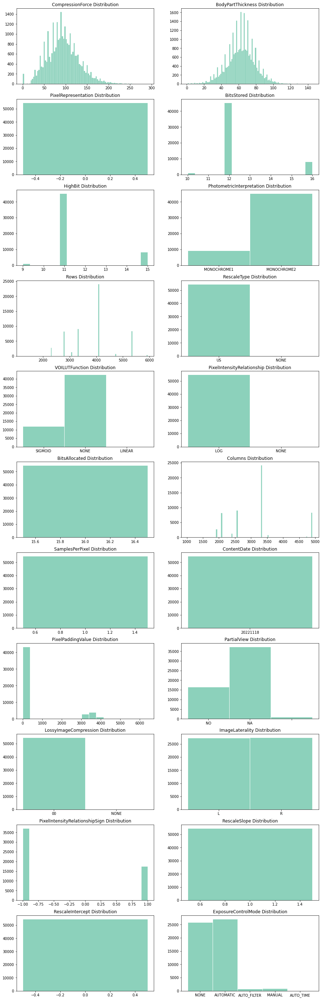

In [7]:
dicom_features = [
    "CompressionForce", "BodyPartThickness", "PixelRepresentation",
    "BitsStored", "HighBit", "PhotometricInterpretation", 
    "Rows", "RescaleType", "VOILUTFunction", "PixelIntensityRelationship",
    "BitsAllocated", "Columns", "SamplesPerPixel", 
    "ContentDate", "PixelPaddingValue", "PartialView",
    "LossyImageCompression", "ImageLaterality",
    "PixelIntensityRelationshipSign", "RescaleSlope", "RescaleIntercept", 
    "ExposureControlMode"
]

dicom_df["RescaleType"] = dicom_df["RescaleType"].fillna("NONE")
dicom_df["VOILUTFunction"] = dicom_df["VOILUTFunction"].fillna("NONE")
dicom_df["PixelIntensityRelationship"] = dicom_df["PixelIntensityRelationship"].fillna("NONE")
dicom_df["PartialView"] = dicom_df["PartialView"].fillna("NA")
dicom_df["LossyImageCompression"] = dicom_df["LossyImageCompression"].fillna("NONE")
dicom_df["ExposureControlMode"] = dicom_df["ExposureControlMode"].fillna("NONE")
dicom_df["PixelRepresentation"] = dicom_df["PixelRepresentation"].apply(lambda x: int(x)).astype(np.int8)

fig, axs = plt.subplots(nrows=11, ncols=2, figsize=(15, 50))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

for i, feature in enumerate(dicom_features):
    _ = sns.histplot(dicom_df, x="{}".format(feature), ax=axs[i])
    _ = axs[i].set_title("{} Distribution".format(feature))
    _ = axs[i].set_ylabel("")
    _ = axs[i].set_xlabel("")

We can take a quick look at the statistical properties of the `CompressionForce` and `BodypartThickness` measurements.

In [8]:
features = ["CompressionForce", "BodyPartThickness"]
dicom_df[features].describe().T.style.bar(subset=['mean'], color='#7BCC70')\
    .background_gradient(subset=['std'], cmap='Reds')\
    .background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
CompressionForce,28900.000000,94.012540,36.885539,0.000000,69.836750,91.632930,116.542800,290.912300
BodyPartThickness,28799.000000,62.665766,16.001606,1.000000,53.000000,63.000000,73.000000,145.000000


### Key Observations About Dicom Metadata

* Both `CompressionForce` and `BodyPartThickness` measurements may be useful for future investigation. While only observed in half of the image data we have, they still may add information that we can use.
* The `ContentDate` field may have provided us unique insights into when various imaging series have been undertaken. For example, we may have seen the progression of a disease or been able to determine whether a finding was difficult to ascertain based solely upon the date the image was taken. However, the field appears to have been sanitized.
* The number of `BitsStored` varies, meaning we're likely to have different qualities of images depending on the dicom file.
* We have a wide variety of `Rows` and `Columns`, meaning that image sizes and resolutions are going to be varied. We'll probably need to normalize / standardize the resolution of the images. Need to be wary of generating compression artifacts or of losing information if we do so.
* Two different `PhotometricInterpretation` types are available. Again, we need to be aware this may result in different interpretations when we view the images themselves.
* The `VOILUTFunction` types are different. Briefly, VOI is a Value Of Interest, and LUT is a Look Up Table. VOI LUT functions specify how pixel intensity values should be presented when viewed. The lookup table values may have a non-linear relationship to the intensity value physically encoded in the image. Again, this can impact our perception of the image as we view it. We need to make sure we properly represent the dicom image when we display it or use it in a machine learning process.

# 1.3 - Continuous Features

We should look a little closer to see what types of data we have in our columns as features. Just based on a first glance of the actual dataframe, it looks like we have the following continuous features:

* `age`
* `BIRADS` 

We can verify this by plotting out their distributions:

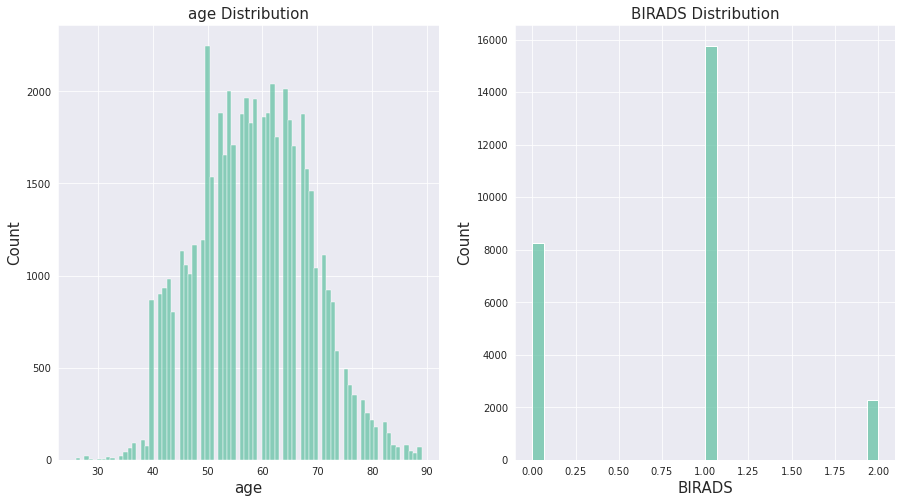

In [9]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

_ = sns.histplot(train, x="age", ax=axs[0])
_ = axs[0].set_title("age Distribution", fontsize=15)
_ = axs[0].set_ylabel("Count", fontsize=15)
_ = axs[0].set_xlabel("age", fontsize=15)

_ = sns.histplot(train, x="BIRADS", ax=axs[1])
_ = axs[1].set_title("BIRADS Distribution", fontsize=15)
_ = axs[1].set_ylabel("Count", fontsize=15)
_ = axs[1].set_xlabel("BIRADS", fontsize=15)

We can see that `age` is indeed continuous, but `BIRADS` is not. We can see that there are 3 unique values for `BIRADS`: 0, 1, or 2. According to Pesce _et al._ (2019), BI RADS scores refer to Breast Imaging Report and Database System scores. The score is a categorical value ranging from 0 - 6, with low level scores generally indicating low suspicion of cancer. Let's take a closer look at the score information available.

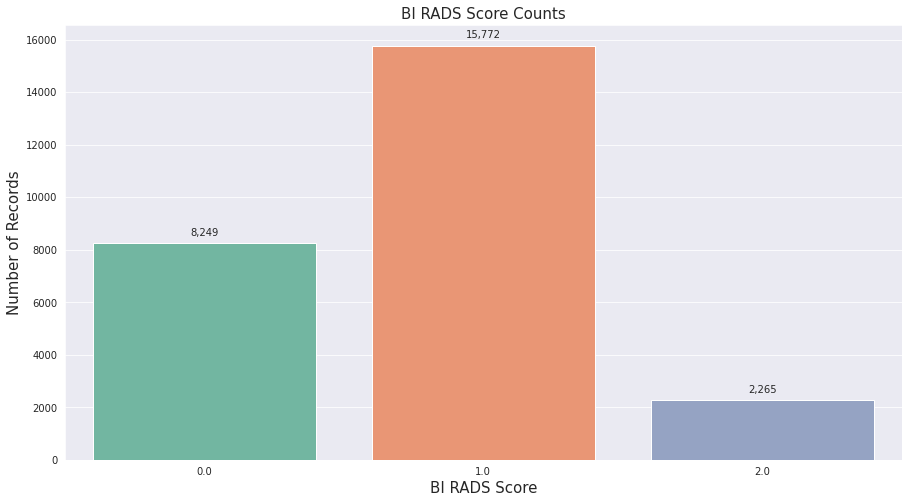

In [10]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train["BIRADS"].value_counts()).rename(index={"0.0": "0", "1.0": "1", "2.0": "2"})
_ = sns.barplot(x=counts.index, y=counts.BIRADS, ax=axs)
for p in axs.patches:
    axs.text(x=p.get_x()+(p.get_width()/2), y=p.get_height()+300, s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs.set_title("BI RADS Score Counts", fontsize=15)
_ = axs.set_ylabel("Number of Records", fontsize=15)
_ = axs.set_xlabel("BI RADS Score", fontsize=15)

Here we can see the training data contains BI RADS scores 0 - 2. We'll dig into those scores more below, when we look at specific features. 

### Key Observations About Continuous Features

* The `age` feature looks to be continuous.
* The `BIRADS` feature is actually categorical.

# 1.4 - Categorical Features

In much the same way that we looked at continuous features, we can check to make sure our intuitions about categorical features are correct by plotting their distributions.

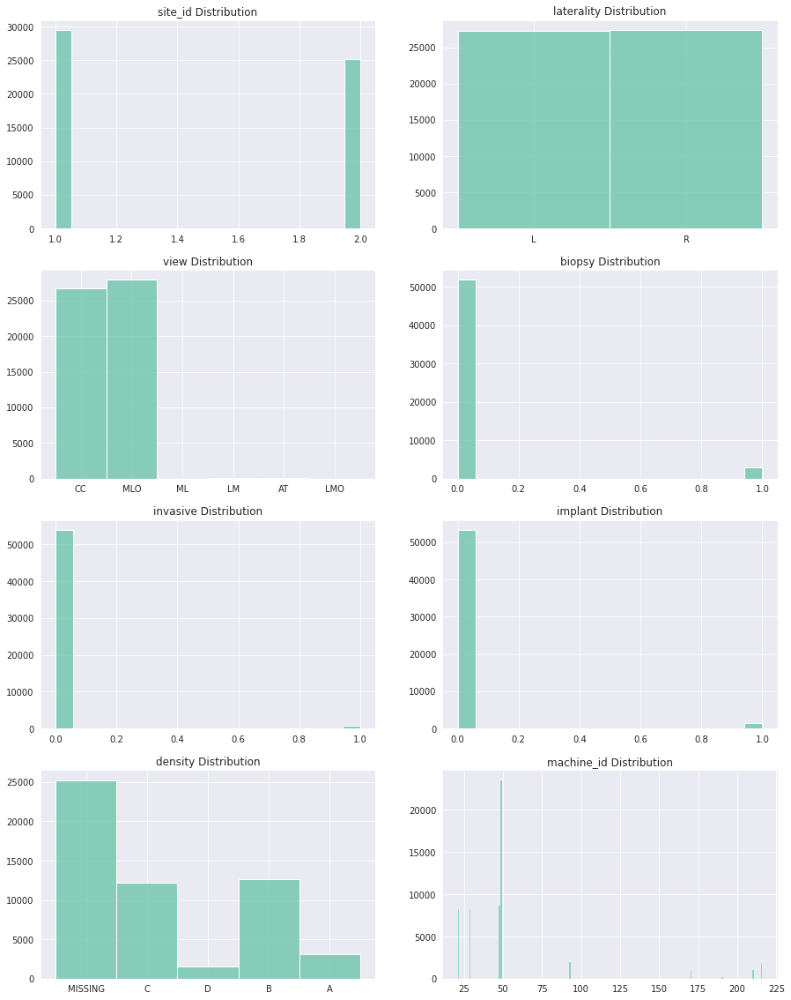

In [11]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

sns.set_style('darkgrid')
sns.set_palette('Set2')

train_subset = train.copy()
train_subset["density"] = train_subset["density"].fillna("MISSING")
features = ["site_id", "laterality", "view", "biopsy", "invasive", "implant", "density", "machine_id"]
axs = axs.flatten()

for i, feature in enumerate(features):
    _ = sns.histplot(train_subset, x="{}".format(feature), ax=axs[i])
    _ = axs[i].set_title("{} Distribution".format(feature))
    _ = axs[i].set_ylabel("")
    _ = axs[i].set_xlabel("")

### Key Observations About Categorical Features

* The `biopsy`, `implant`, `invasive`, and `difficult_negative_case` features are binary in nature.

# 2 Statistical Properties

In this section, we'll take a look first at some overall statistical impressions of the training data to see if there are any points of interest.

# 2.1 - Target Class Balance

A good starting point is to look at class balance. This check can inform us whether or not we need to adjust our machine learning approaches when we build the actal prediction model (i.e. do we need to over-sample, under-sample, generate synthetic data, etc). In most real-world cases, the things that are difficult to predict are usually rare, and thus end up being under-represented in our training data. Let's take a look at the column we are being asked to predict, which is the `cancer` column.

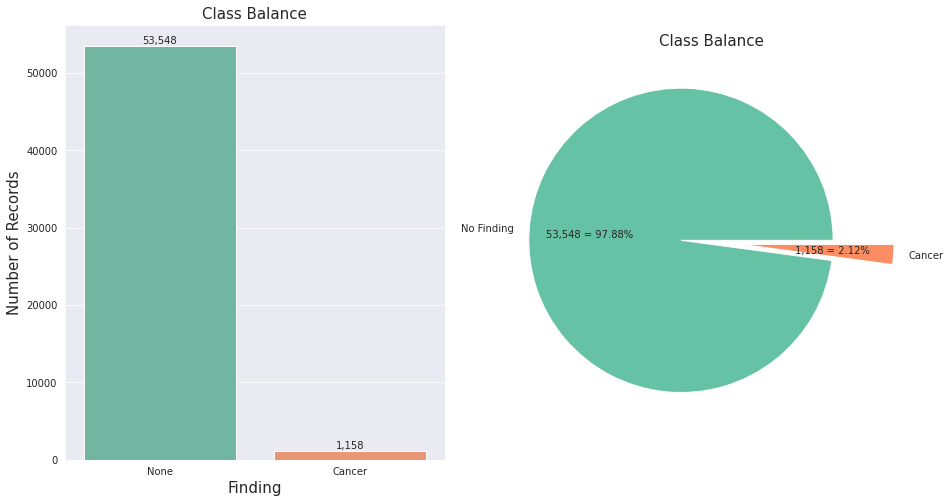

In [12]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train["cancer"].value_counts()).rename(index={0: "None", 1: "Cancer"})
_ = sns.barplot(x=counts.index, y=counts.cancer, ax=axs[0])
for p in axs[0].patches:
    axs[0].text(x=p.get_x()+(p.get_width()/2), y=p.get_height()+300, s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[0].set_title("Class Balance", fontsize=15)
_ = axs[0].set_ylabel("Number of Records", fontsize=15)
_ = axs[0].set_xlabel("Finding", fontsize=15)

data = [
    train[(train["cancer"] == 0)]["biopsy"].count(),
    train[(train["cancer"] == 1)]["biopsy"].count()
]
labels = ["No Finding", "Cancer"]
_ = axs[1].pie(
    data, labels=["No Finding", "Cancer"],
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
    explode=[0.20] * 2, 
    colors=sns.color_palette("Set2")[0:2],
)
_ = axs[1].set_title("Class Balance", fontsize=15)

### Key Observations About Class Balance

* Clearly we have a class imbalance issue with our predicted column. This means that we will need to do something to counter-act the weight of the no finding class. In particular, we can look at methods of under-sampling or over-sampling. However, given that we have image data, we may be able to perform data augmentation in order to boost the amount of information available for training. In particular, we may want to generate new rows for existing patients under new patient ids where the left and right `laterality` images are swapped (with image processing accordingly, and cancer findings swapped accordingly). This can double our available number of records with cancer findings available to learn from. We may also want to skew, add jitter, or slightly rotate the images to provide more variety in our training data as well.

# 2.2 - Null Values

Let's explore the issue of missing values in the dataset to see if there are systemic problems with data representation.

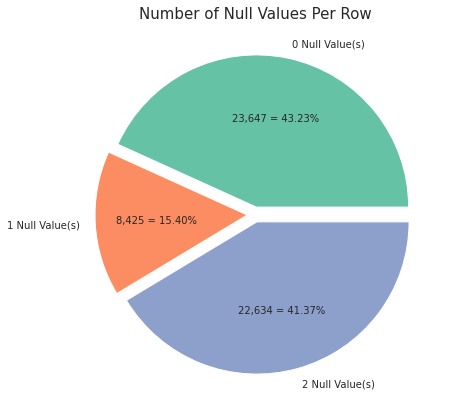

In [13]:
train["null_count"] = train.isnull().sum(axis=1)
counts = train.groupby("null_count")["image_id"].count().to_dict()
null_data = {"{} Null Value(s)".format(k) : v for k, v in counts.items() if k < 8}

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 7))
_ = axs.pie(
    x=list(null_data.values()), 
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(null_data.values())/100, x),
    explode=[0.05] * len(null_data.keys()), 
    labels=null_data.keys(), 
    colors=sns.color_palette("Set2")[0:3],
)
_ = axs.set_title("Number of Null Values Per Row", fontsize=15)

Let's take a closer look a the columns that have null values.

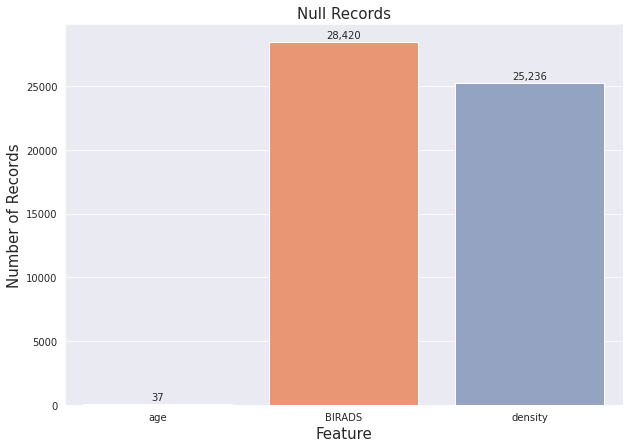

In [14]:
sns.set_style('darkgrid')
sns.set_palette('Set2')

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 7))

null_values = train.isna().sum().loc[lambda x: x > 0]
_ = sns.barplot(x=null_values.index, y=null_values.values, ax=axs)
for p in axs.patches:
    axs.text(x=p.get_x()+(p.get_width()/2), y=p.get_height()+300, s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs.set_title("Null Records", fontsize=15)
_ = axs.set_ylabel("Number of Records", fontsize=15)
_ = axs.set_xlabel("Feature", fontsize=15)

### Key Observations About Null Values

* For the `age` feature we have relatively few records with null values. Given that we have a continuous variable, we may be able to impute the missing value by filling it in with the statistical mean age instead.
* For the `BIRADS` feature, given that there are so many records with missing values, we cannot simply drop the rows that have this value as null. Instead, we will need to understand it's general makeup before we can devise a method of imputing a correct value. Note however, since `BIRADS` does not show up in the testing set, we have the option of ignoring it altogether.
* For the `density` feature, much like `BIRADS`, we will need to figure out a way to impute missing values, or ignore the feature altogether. 

# 2.3 - Statistical Breakdown

Let's take a closer look at some of the statistical properties of the continuous features.

In [15]:
features = ["age"]
train[features].describe().T.style.bar(subset=['mean'], color='#7BCC70')\
    .background_gradient(subset=['std'], cmap='Reds')\
    .background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
age,54669.000000,58.543928,10.050884,26.000000,51.000000,59.000000,66.000000,89.000000


Looks like our `age` feature is informative for us. In particular, we can see that patients have a mean age of 58 years old (+- 10 years). In fact, we rarely see patients who are younger than 51 years old, with the youngest being 26.

### Key Observations About Statistical Breakdowns

* The `age` feature ranges from 26 to 89. 
    * Patients with ages less than 51 are uncommon.
    * Age ranges tend to fall between 41 and 61.
    * It is possible to have null values in the age range. Given the number of nulls, we can likely impute missing values using the mean value for the feature.

# 2.4 - P-Value Testing

While looking at features visually will tell us some interesting information, we can also use p-value testing to see if a feature has a net impact on a simple regression model. This method is controversial in that it likely doesn't provide a correct look at what features are informative. Our null hypothesis is that the feature impacts the target variable of `cancer`. In this case, anything with a p-value greater than 0.05 means we reject that hypothesis, and can potentially flag it for removal. Before we begin our analysis, we will also have to deal with missing values. For the `age` feature, we will use the mean age of the training set. For `BIRADS` we set it to a value of `10` to indicate an impossible score.

In [16]:
features = [
    "site_id", "age", "biopsy", "invasive", 
    "BIRADS", "implant", "machine_id"
]

from statsmodels.regression.linear_model import OLS
from statsmodels.tools.tools import add_constant

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

train_subset = train.copy()
train_subset["age"] = train_subset["age"].fillna(51)
train_subset["density"] = train_subset["density"].fillna("MISSING")
train_subset["BIRADS"] = train_subset["BIRADS"].fillna(10)
x = add_constant(train_subset[features])
model = OLS(train_subset["cancer"], x).fit()

pvalues = pd.DataFrame(model.pvalues)
pvalues.reset_index(inplace=True)
pvalues.rename(columns={0: "pvalue", "index": "feature"}, inplace=True)
pvalues.style.background_gradient(cmap='YlOrRd')

,feature,pvalue
0,const,0.000000
1,site_id,0.000311
2,age,0.000000
3,biopsy,0.000000
4,invasive,0.000000
5,BIRADS,0.000000
6,implant,0.197777
7,machine_id,0.087494


### Key Observations About P-Value Testing

* The `implant` field has a p-value of 0.197. This suggests that it may have little impact on our classifier, and may be a candidate for removal.
* The `machine_id` field has a p-value of 0.087. This suggests that it may have little impact on our classifier, and may be a candidate for removal.

# 2.5 - Spearman Correlation

We should also check to see what variables are correlated to one another. Spearman correlation does not make assumptions about distribution types or linearity. With Spearman correlation, we have values that range from -1 to +1. Values around either extreme end mean a neagative or positive correlation respectively, while those around 0 mean no correlation exists.

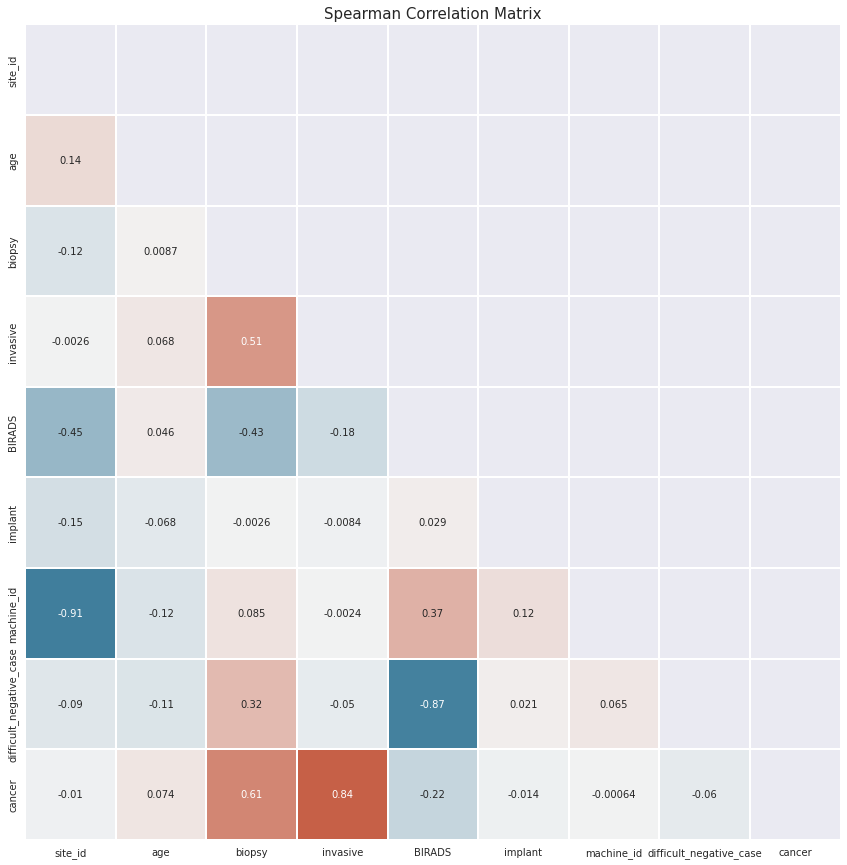

In [17]:
features = [
    "site_id", "age", "biopsy", "invasive", 
    "BIRADS", "implant", "machine_id", "density",
    "difficult_negative_case", "cancer"
]
correlation_matrix = train[features].corr(method="spearman")

from matplotlib.colors import SymLogNorm

f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
_ = sns.heatmap(
    correlation_matrix, 
    mask=np.triu(np.ones_like(correlation_matrix, dtype=bool)), 
    cmap=sns.diverging_palette(230, 20, as_cmap=True), 
    center=0,
    square=True, 
    linewidths=.1, 
    cbar=False,
    ax=ax,
    annot=True,
)
_ = ax.set_title("Spearman Correlation Matrix", fontsize=15)

### Key Observations About Spearman Correlation

There are some expected correlations:

* The `invasive` and `biopsy` features share a strong correlation. This would be expected as biopsies are typically invasive procedures.
* The `cancer` and `biopsy` features share a strong correlation. This is expected as more diagnostics would usually be required to make a firm diagnosis, and most final diagnoses require a biopsy to be sure.
* The `cancer` and `invasive` features share a strong correlation. This is expected as a biopsy would usually be performed for diagnostic purposes, and is considered to be an invasive procedure.
* The `biopsy` and `difficult_negative_case` share a strong correlation. This is expected as more diagnostic tools (such as biopsy) would be used when the imaging results may not be revealing much.
* The `site_id` and `machine_id` features share a strong correlation. This is expected because imaging machines are installed at a single site and are usually permanently attached to that site.

There are also some unexpected correlations:

* The `site_id` and `BIRADS` features share an interesting correlation. It could be that one particular site provides more interpretations associated with images, and the other one does not.
* In a similar avenue, the `machine_id` and `BIRADS` features have a correlation. Again, because machines are associated with only one site, if that one site provides more interpretations, then machines at those sites will likely have more `BIRADS` scores.
* The `site_id` and `implant` features share a weak correlation.
* The `site_id` and `age` features share a weak correlation. This however may be in relation to the `age` and `difficult_negative_case` correlation. Difficult cases may require additional imaging series across several sites.

# 3 Feature Exploration

With a general statistical breakdown of the columns out of the way, we should perform a more in-depth exploration of our various features.

# 3.1 - View Feature

The first interesting feature to note is the `view` categorical feature. 

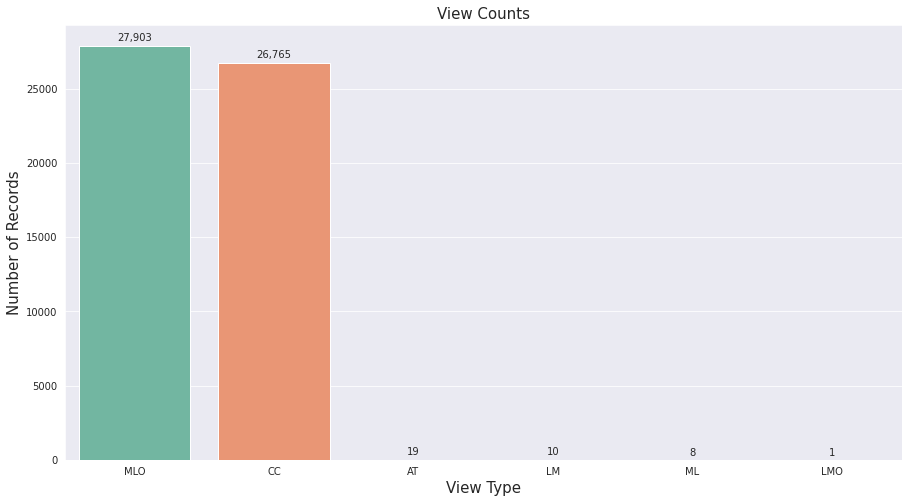

In [18]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train["view"].value_counts())
_ = sns.barplot(x=counts.index, y=counts.view, ax=axs)
for p in axs.patches:
    axs.text(x=p.get_x()+(p.get_width()/2), y=p.get_height()+300, s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs.set_title("View Counts", fontsize=15)
_ = axs.set_ylabel("Number of Records", fontsize=15)
_ = axs.set_xlabel("View Type", fontsize=15)

We can see from the representation here that the images are primarily comprised of two different views:

* `MLO` - Mediolateral Oblique View - captures the most breast tissue. The pectoral muscle is included in the view, and is used as a guide to assess proper patient positioning and overall image quality. The MLO view is taken looking downwards, but angled to look from the center of the chest outwards.
* `CC` - Craniocaudal View - as with the Mediolateral Oblique View, the pectoral muscle may be included in the view, which again is used as a guide to assess proper patient positioning. The main difference however, is that the Crainocaudal View is taken from above the breast looking straight downwards (i.e. no angle is introduced as in the oblique view).

Both `MLO` and `CC` views are known as _standard views_. These views are the ones most commonly used in routine screening. It is worthwhile to note however, there may be contraindications where these views are not performed, such as when disease processes are present. With patients under 40, only the `MLO` of the left and right sides may be performed to reduce overall radiation exposure, since it adequately captures the most breast tissue.

In addition to the standard views, there are other significantly less utilized views in the training set, which are separate and distinct from `MLO` and `CC`:

* `AT` - Unknown - possibly Tangent View?
* `ML` - Mediolateral View - taken from the center of the chest between the breasts, looking outwards. Usually used in instances where the Mediolateral Oblique View has not been taken or is not possible. This is a favored view when the oblique view is not available, as most disease processes occur on the lateral side of the breast, and therefore will be closer to the film allowing for a clearer image of the pathology. 
* `LM` - Lateromedial View - similar to the Mediolateral View, except the view is taken from the arms pointing inwards towards the chest. This view is not as ideal, again due to the tendency for pathology to occur on the lateral side of the breast.
* `LMO` - Lateromedial Oblique View - similar to `MLO` except taken from the outside of the body pointing inwards.

These views may also be modified by additional techniques meant to expose different areas of the breast tissue in the image. 

* Spot compression - where a paddle is used to spread breast tissue out. This attempts to decrease the amount of overlap within the image.
* Magnification - the focal spot of the imaging device is concentrated on a particular area, meaning that not all of the breast will be visible as it would be in standard `MLO` or `CC` views.
* Rolled views - the technician rolls the breast in a particular direction to separate tissues. While folds in the breast tissue will spread out, actual disease tissue will remain in one spot.

References for these descriptions are adapted from [here](https://two-views.com/mammograms/angles-views.html), [here](https://radiopaedia.org/articles/craniocaudal-view), [here](https://radiopaedia.org/articles/mediolateral-oblique-view), and [here](https://www.mammoguide.com/mammo-techniques.html).

A quick example shows some differences in positioning in each view type.

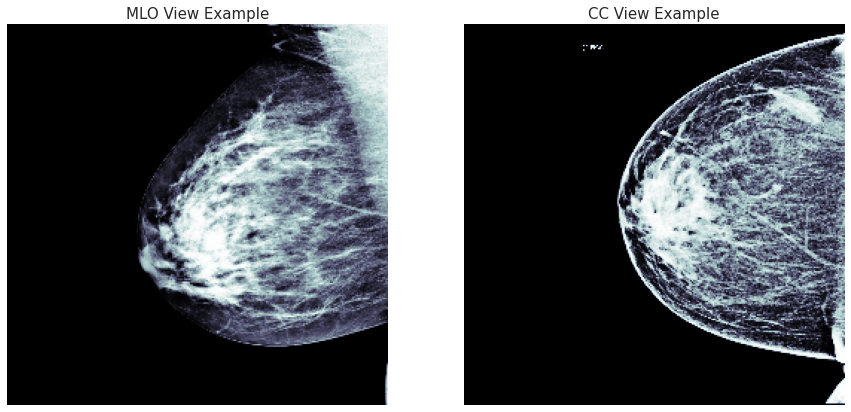

In [19]:
def get_dicom(patient_id, img_id):
    return dcmread(Path(DICOM_PATH_SPEC.format(DATASET_PATH, DATASET_TYPE, patient_id, img_id)))

def get_data(dcm):
    d = avl(dcm.pixel_array, dcm)
    d = amax(d) - d if dcm.get(PHOTO_INT) == MONO else d
    return (d * (255.0 / d.max())).astype(uint8)

def normalize_image(img):
    img = ex.equalize_hist(img) if NORM_TYPE == "histogram" else ex.equalize_adapthist(img/np.max(img))
    return (img * 255).astype(uint8)
    
def resize_image(img, width, height):
    return resize(img, (width, height))

def extract(patient_id, img_id):
    img = get_data(get_dicom(patient_id, img_id))
    height, width = img.shape
    if DO_NORMALIZE:
        img = normalize_image(resize_image(img, RESCALE_WIDTH, RESCALE_HEIGHT))
    return [img_id, width, height, img]

mlo_ex = train[
    (train["age"] > 50.0) & 
    (train["age"] < 55.0) & 
    (train["view"] == "MLO") & 
    (train["laterality"] == "R") &
    (train["cancer"] == 0)
].iloc[[0]]
mlo_ex_img = extract(mlo_ex["patient_id"].iloc[0], mlo_ex["image_id"].iloc[0])

cc_ex = train[
    (train["cancer"] == 1) & 
    (train["age"] > 50.0) & 
    (train["age"] < 55.0) & 
    (train["view"] == "CC") & 
    (train["laterality"] == "R")
].iloc[[2]]
cc_ex_img = extract(cc_ex["patient_id"].iloc[0], cc_ex["image_id"].iloc[0])
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

_ = axs[0].imshow(mlo_ex_img[3], cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("MLO View Example", fontsize=15)
_ = axs[1].imshow(cc_ex_img[3], cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("CC View Example", fontsize=15)

Let's check to see if there is any connection between the view type and a diagnosis of cancer.

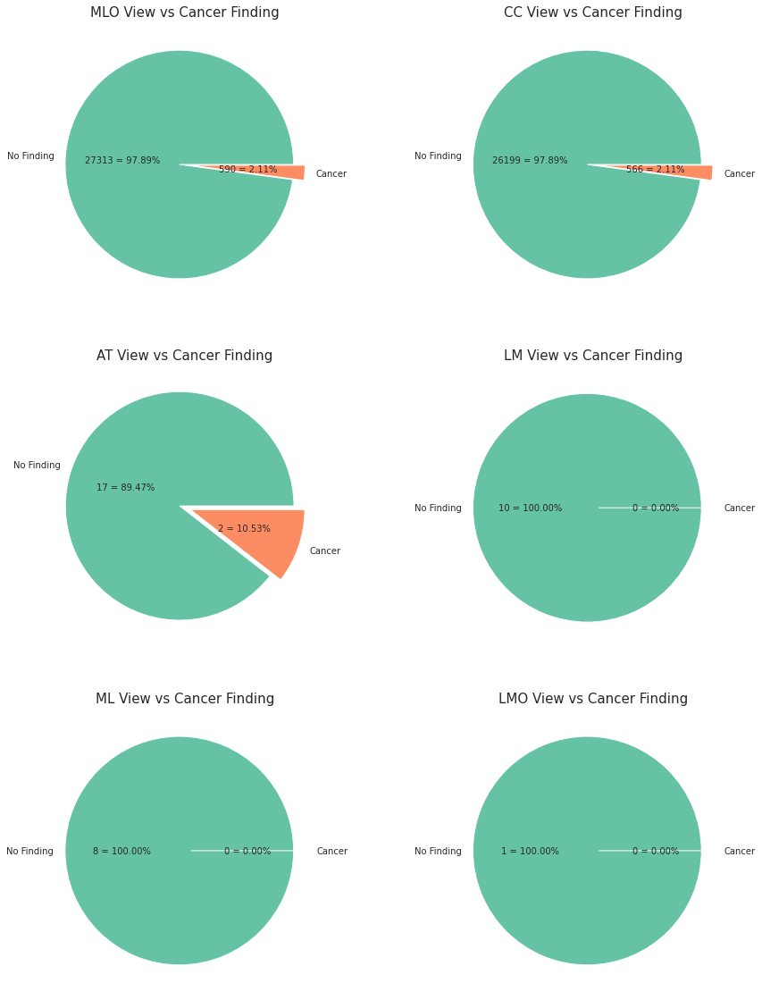

In [20]:
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 20))

sns.set_style('darkgrid')
sns.set_palette('Set2')

views = ["MLO", "CC", "AT", "LM", "ML", "LMO"]
axs = axs.flatten()

for i, view in enumerate(views):
    data = [
        train[(train["cancer"] == 0) & (train["view"] == view)]["image_id"].count(),
        train[(train["cancer"] == 1) & (train["view"] == view)]["image_id"].count()
    ]
    labels = ["No Finding", "Cancer"]
    _ = axs[i].pie(
        data, labels=["No Finding", "Cancer"],
        autopct=lambda x: "{:.0f} = {:.2f}%".format(x * sum(data)/100, x),
        explode=[0.05] * 2, 
        pctdistance=0.5, 
        colors=sns.color_palette("Set2")[0:2],
    )
    _ = axs[i].set_title("{} View vs Cancer Finding".format(view), fontsize=15)

We should also look at age groups. Various sources online suggest that certain view types are not performed depending on age to reduce radiation exposure.

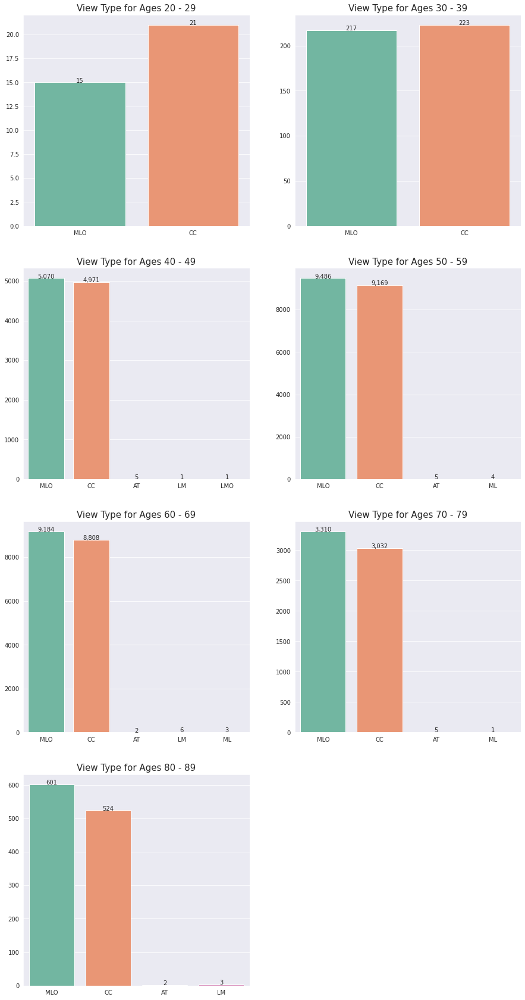

In [21]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(15, 30))

sns.set_style('darkgrid')
sns.set_palette('Set2')

views = ["MLO", "CC", "AT", "LM", "ML", "LMO"]
age_groups = [(20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80), (80, 90)]
labels = ["Ages 20 - 29", "Ages 30 - 39", "Ages 40 - 49", "Ages 50 - 59", "Ages 60 - 69", "Ages 70 - 79", "Ages 80 - 89"]
axs = axs.flatten()

for ag, age_group in enumerate(age_groups):
    data = []
    label = []
    for i, view in enumerate(views):
        count = train[(train["view"] == view) & (train["age"] >= age_group[0]) & (train["age"] < age_group[1])]["image_id"].count()
        if count > 0:
            data.append(count)
            label.append(views[i])
      
    _ = sns.barplot(x=label, y=data, ax=axs[ag])
    for p in axs[ag].patches:
        axs[ag].text(x=p.get_x()+(p.get_width()/2), y=p.get_height(), s="{:,d}".format(round(p.get_height())), ha="center")
    _ = axs[ag].set_title("View Type for {}".format(labels[ag]), fontsize=15)
    
_ = axs[7].axis("off")

The only age group with a significant difference between the `CC` and `MLO` views are for the 20-29 year old grouping. Otherwise, the view types appear to be fairly balanced.

### Key Observations About View

* The `MLO` and `CC` views are the dominant view types that we see within the data. 
    * Both views are roughly equal in terms of the number of times a diagnosis of `cancer` was made.
    * While literature suggests `MLO` is used more extensively with patients under the age of 40, the data do not suggest it.
* The `ML`, `LMO` and `LM` views are not associated with a finding of `cancer`. 
* Because the `CC` and `MLO` views occur at different angles, it may be necessary to train two separate classifiers - each one trained on a different view type.
* Images should be examined to see if there is evidence of spot compression, magnification, or rolling. Each of these techniques will expose different portions of tissue to the film, and therefore may be more or less likely to spot pathology.

# 3.2 - Biopsy Feature

As mentioned in the introduction section, there are classes in our training data that do not show up in the testing set, but we should look at to see if they can be used for first-pass coarse filtering of negative cases. One particular feature is the `biopsy` feature. Let's take a look at the general breakdown of biopsies.

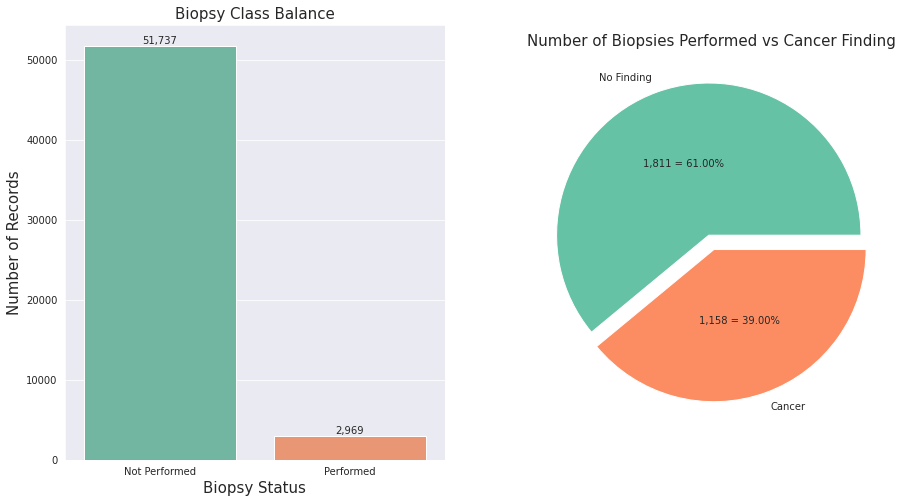

In [22]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train["biopsy"].value_counts()).rename(index={0: "Not Performed", 1: "Performed"})
_ = sns.barplot(x=counts.index, y=counts.biopsy, ax=axs[0])
for p in axs[0].patches:
    axs[0].text(x=p.get_x()+(p.get_width()/2), y=p.get_height()+300, s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[0].set_title("Biopsy Class Balance", fontsize=15)
_ = axs[0].set_ylabel("Number of Records", fontsize=15)
_ = axs[0].set_xlabel("Biopsy Status", fontsize=15)

data = [
    train[(train["cancer"] == 0) & (train["biopsy"] == 1)]["image_id"].count(),
    train[(train["cancer"] == 1) & (train["biopsy"] == 1)]["image_id"].count()
]
labels = ["No Finding", "Cancer"]
_ = axs[1].pie(
    data, labels=["No Finding", "Cancer"],
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
    explode=[0.05] * 2, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:2],
)
_ = axs[1].set_title("Number of Biopsies Performed vs Cancer Finding", fontsize=15)

We can see that when biopsies are performed, 61% of the time there is no finding, while 39% of the time there is a cancer finding. Let's see if there is any further resolution available if we look at `age`. 

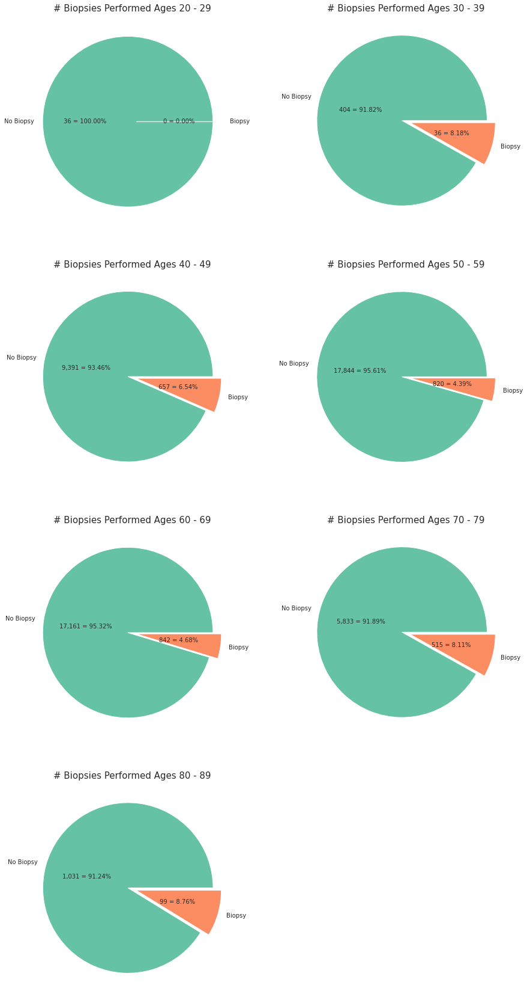

In [23]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(15, 30))

sns.set_style('darkgrid')
sns.set_palette('Set2')

age_groups = [(20, 30), (30, 40), (40, 50), (50, 60), (60, 70), (70, 80), (80, 90)]
labels = ["Ages 20 - 29", "Ages 30 - 39", "Ages 40 - 49", "Ages 50 - 59", "Ages 60 - 69", "Ages 70 - 79", "Ages 80 - 89"]
axs = axs.flatten()

for ag, age_group in enumerate(age_groups):
    data = [
        train[(train["biopsy"] == 0) & (train["age"] >= age_group[0]) & (train["age"] < age_group[1])]["image_id"].count(),
        train[(train["biopsy"] == 1) & (train["age"] >= age_group[0]) & (train["age"] < age_group[1])]["image_id"].count()
    ]

    label = ["No Biopsy", "Biopsy"]
    _ = axs[ag].pie(
        data, labels=label,
        autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
        explode=[0.05] * 2, 
        pctdistance=0.5, 
        colors=sns.color_palette("Set2")[0:2],
    )
    _ = axs[ag].set_title("# Biopsies Performed {}".format(labels[ag]), fontsize=15)
    
_ = axs[7].axis("off")

In all but the youngest age range of 20 - 29 years old, biopsies are performed at a rate between roughly 4% to 9% of the time. The question is why. 

Given that biopsies are invasive procedures, it makes sense to reserve them for difficult cases. Our Spearman Correlation analysis suggested a weak positive correlation between the `difficult_negative_case` and `biopsy`. Let's look to see how they are linked.

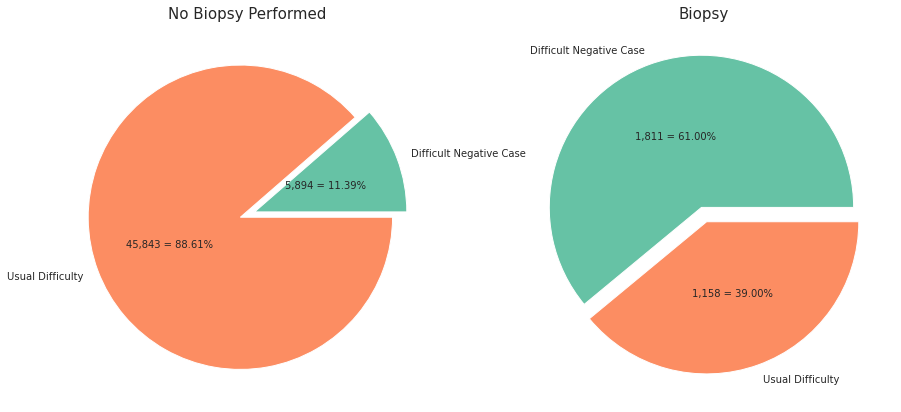

In [24]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')


labels = ["Difficult Negative Case", "Usual Difficulty"]
data = [
    train[(train["difficult_negative_case"] == True) & (train["biopsy"] == 0)]["image_id"].count(),
    train[(train["difficult_negative_case"] == False) & (train["biopsy"] == 0)]["image_id"].count()
]
_ = axs[0].pie(
    data, labels=labels,
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
    explode=[0.05] * 2, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:2],
)
_ = axs[0].set_title("No Biopsy Performed", fontsize=15)

data = [
    train[(train["difficult_negative_case"] == True) & (train["biopsy"] == 1)]["image_id"].count(),
    train[(train["difficult_negative_case"] == False) & (train["biopsy"] == 1)]["image_id"].count()
]
_ = axs[1].pie(
    data, labels=labels,
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
    explode=[0.05] * 2, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:2],
)
_ = axs[1].set_title("Biopsy", fontsize=15)

Looks like we may have hit on something interesting here:

* There are 1,158 instances when a biopsy is performed and the case is considered to be of "usual" difficulty.
* There are 1,158 instances where there is cancer present.

This suggests that all patients with the "usual" case difficulty and a biopsy have cancer. Let's just double check this:

In [25]:
biopsy_total = train[(train["biopsy"] == 1) & (train["difficult_negative_case"] == False)]["cancer"].sum()
cancer_total = train[(train["cancer"] == 1)]["cancer"].sum()

print("> Total cancer records: {:,d}".format(cancer_total))
print("> Total cancer records with biopsy and difficult_negative_case == False: {:,d}".format(biopsy_total))

> Total cancer records: 1,158
> Total cancer records with biopsy and difficult_negative_case == False: 1,158


This is an interesting detail. While the testing dataset does not have `biopsy` as a feature, if we can build a biopsy predictor, then we have captured all the cancer diagnoses. This is unsurprising, as all cancer patients need a biopsy in order to be diagnosed with cancer. Let's see if we can find strong predictors of biopsies. Our Spearman Correlation said `site_id` was weakly correlated with the `biopsy` feature. Let's see if there are any standouts.

_In progress..._

# 3.3 - BIRADS Feature

As mentioned previously, the `BIRADS` feature likely corresponds to the BI RADS score. This is a system that categorizes findings into various groupings. These groups associated with score can be characterized as follows:

* `0` - incomplete testing or more testing required. There may have been a problem or difficulty interpreting the image. Typically this means that the doctor wants further imaging series to compare against.
* `1` - negative result. This means that the results of the mammogram are normal, an no potential cancer was detected.
* `2` - negative result, but benign masses may be present. Further routine screening is usually suggested as follow up.
* `3` - slight probability of cancer (approximately 2%). Usually requires a follow up screening within 6 months to monitor any abnormalities.
* `4` - high probability of cancer (between 20 - 30%). Usually followed up with a biopsy. Three additional sub-classifications exist for degree of suspicion.
* `5` - very high probability of cancer (above 90%). Again, a follow up biopsy is usually performed.
* `6` - only denoted once a cancer diagnosis is confirmed. This type of imaging is used for future comparisons once treatment has begun.

Now that we know what the categorical classifications represent, let's look again at the findings that we have in the training set.

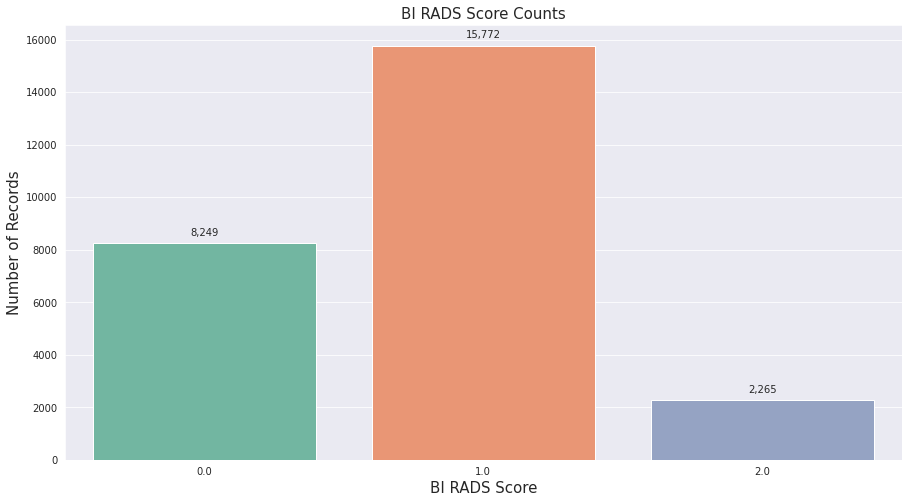

In [26]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train["BIRADS"].value_counts()).rename(index={"0.0": "0", "1.0": "1", "2.0": "2"})
_ = sns.barplot(x=counts.index, y=counts.BIRADS, ax=axs)
for p in axs.patches:
    axs.text(x=p.get_x()+(p.get_width()/2), y=p.get_height()+300, s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs.set_title("BI RADS Score Counts", fontsize=15)
_ = axs.set_ylabel("Number of Records", fontsize=15)
_ = axs.set_xlabel("BI RADS Score", fontsize=15)

At first glance, it appears to be unfortunate that categories 3, 4, and 5 are not represented in this data (they may have been present in the null data). However, the categorization we do have available is actually quite useful when we contrast it with the actual target variable of `cancer`.

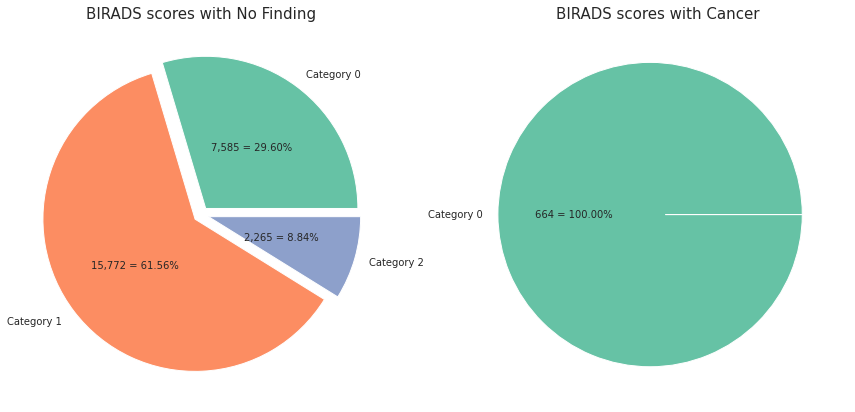

In [27]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

data = [
    train[(train["cancer"] == 0) & (train["BIRADS"] == 0.0)]["image_id"].count(),
    train[(train["cancer"] == 0) & (train["BIRADS"] == 1.0)]["image_id"].count(),
    train[(train["cancer"] == 0) & (train["BIRADS"] == 2.0)]["image_id"].count(),
]
counts = pd.DataFrame()
_ = axs[0].pie(
    data, labels=["Category 0", "Category 1", "Category 2"],
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
    explode=[0.05] * 3, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:3],
)
_ = axs[0].set_title("BIRADS scores with No Finding", fontsize=15)

data = [
    train[(train["cancer"] == 1) & (train["BIRADS"] == 0.0)]["image_id"].count(),
    train[(train["cancer"] == 1) & (train["BIRADS"] == 1.0)]["image_id"].count(),
    train[(train["cancer"] == 1) & (train["BIRADS"] == 2.0)]["image_id"].count(),
]
counts = pd.DataFrame()
_ = axs[1].pie(
    data, labels=["Category 0", "", ""],
    autopct=lambda x: "{:.0f} = {:.2f}%".format(x * sum(data)/100, x) if x > 0 else "",
    explode=[0.05] * 3, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:3],
)
_ = axs[1].set_title("BIRADS scores with Cancer", fontsize=15)

This observation is _very_ important for 2 reasons. First and foremost, it shows us that category 2 findings (normal but with cysts or masses) are all classified as *non-cancerous*. This gives us 2,265 samples that we can look at where there may be suspicious masses, but they are _not indicative of cancer_. This is going to be important when constructing our classifier to show it images of masses that are actually benign, versus masses that are cancerous. While we don't know the categorical classification of the test set, we can potentially build a classifier that can coarsely filter the findings for us. To demonstrate, we can compare two different mammograms using the same view type (MLO), one of a category 2, and another one that has a diagnosis of cancer.

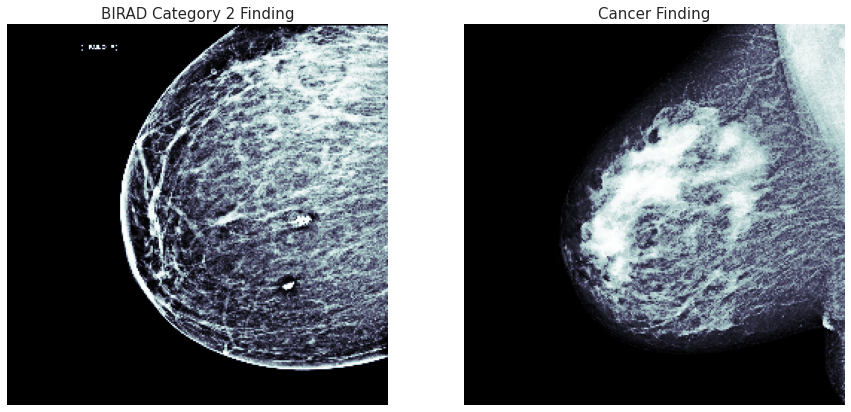

In [28]:
birad_2_ex = train[
    (train["BIRADS"] == 2.0) & 
    (train["age"] > 50.0) & 
    (train["age"] < 55.0) & 
    (train["view"] == "MLO") & 
    (train["laterality"] == "R")
].iloc[[3]]
birad_2_img = extract(birad_2_ex["patient_id"].iloc[0], birad_2_ex["image_id"].iloc[0])

cancer_ex = train[
    (train["cancer"] == 1) & 
    (train["age"] > 50.0) & 
    (train["age"] < 55.0) & 
    (train["view"] == "MLO") & 
    (train["laterality"] == "R") & 
    (train["BIRADS"] != 0.0)
].iloc[[10]]
cancer_img = extract(cancer_ex["patient_id"].iloc[0], cancer_ex["image_id"].iloc[0])
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

_ = axs[0].imshow(birad_2_img[3], cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("BIRAD Category 2 Finding", fontsize=15)
_ = axs[1].imshow(cancer_img[3], cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("Cancer Finding", fontsize=15)

There are several differences between images of a BIRAD category 2 finding and a cancer finding. Notice in the BIRAD finding there are small areas or nodules, while in the cancer finding, there are not. This type of differentiation may be useful when it comes to the actual machine learning classification portion that looks at image data.

The second observation that is important is the BIRAD category 1 findings. There are 15,772 images that are classified as normal, with no anomalous readings. This means that these images can provide a good reference point for anomaly detection, as they provide a "clean" baseline from which to work with. 

### Key Observations About BIRADS

* The `BIRADS` feature is not available in the testing set, however, it may be possible to build a soft-label classifier that can tentatively tag items with a BI RADS score.
* The 2,265 `BIRADS` records with a score of 2.0 is important. Category 2 BI RADS scores mean that the results are normal. However, there may be non-cancerous masses or other anomalies present within the image. This is useful when training - is the trained classifier flagging false positives on these records?
* The 15,772 `BIRADS` records with a score of 1.0 is important. These are normal results with no anomalies. This is useful when training - is the trained classifier flagging false positive on these records?

# 3.4 - Density Feature

The `density` feature is a categorical variable that describes how dense the breast tissue is. Once again, this feature is provided for training, but not for testing. According to the competition metric, a rating of `A` means the tissue is less dense, and a rating of `D` means more dense. Denser tissue suggests a more difficult diagnosis.

One of the difficulties we have is that `density` is not supplied for each training record in our training set. We'll need to impute what a correct value should be (more on this in a moment). First, let's just look to see what kind of relationship we have between `density` and `cancer`. We'll fill in missing values with `MISSING`.

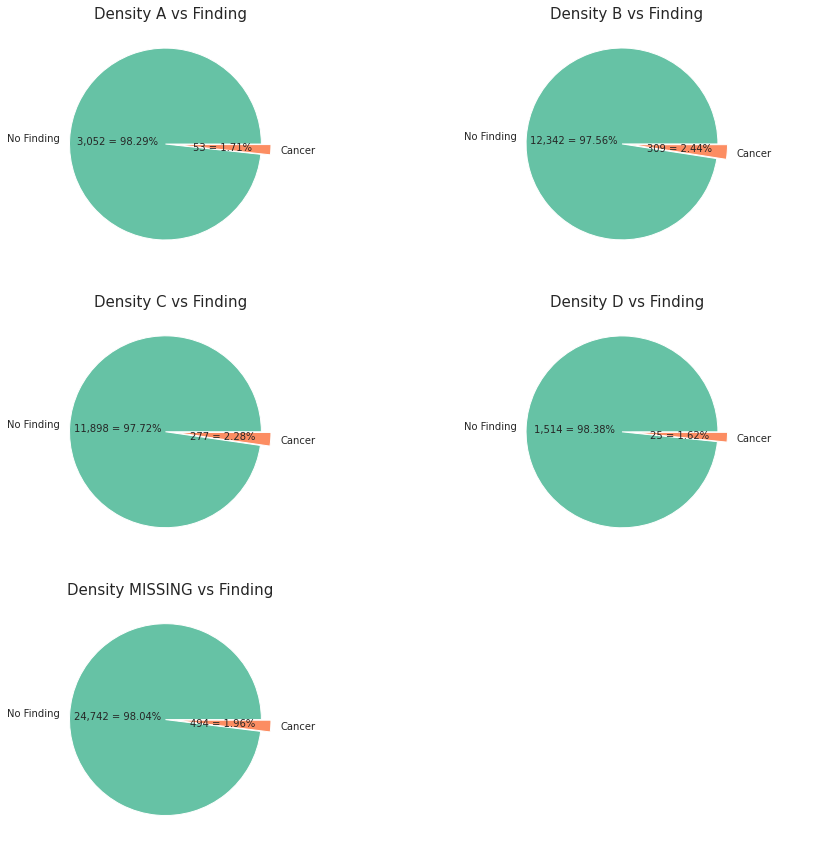

In [29]:
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

densities = ["A", "B", "C", "D", "MISSING"]
axs = axs.flatten()

train_subset = train.copy()
train_subset["density"] = train_subset["density"].fillna("MISSING")

for index, density in enumerate(densities):
    data = [
        train_subset[(train_subset["cancer"] == 0) & (train_subset["density"] == density)]["image_id"].count(),
        train_subset[(train_subset["cancer"] == 1) & (train_subset["density"] == density)]["image_id"].count()
    ]

    label = ["No Finding", "Cancer"]
    _ = axs[index].pie(
        data, labels=label,
        autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
        explode=[0.05] * 2, 
        pctdistance=0.5, 
        colors=sns.color_palette("Set2")[0:2],
    )
    _ = axs[index].set_title("Density {} vs Finding".format(density), fontsize=15)
    
_ = axs[5].axis("off")

For each group, we are seeing between 1.5 - 2.5% of the findings being cancer. That means regardless of the density, we're seeing about the same rate of cancer. As indicated on the competition Dataset Description:

* _"Extremely dense tissue can make diagnosis more difficult."_

Let's take a look to see if `difficult_negative_case` has any interaction with `density`. Again, we'll do a breakdown by density groups.

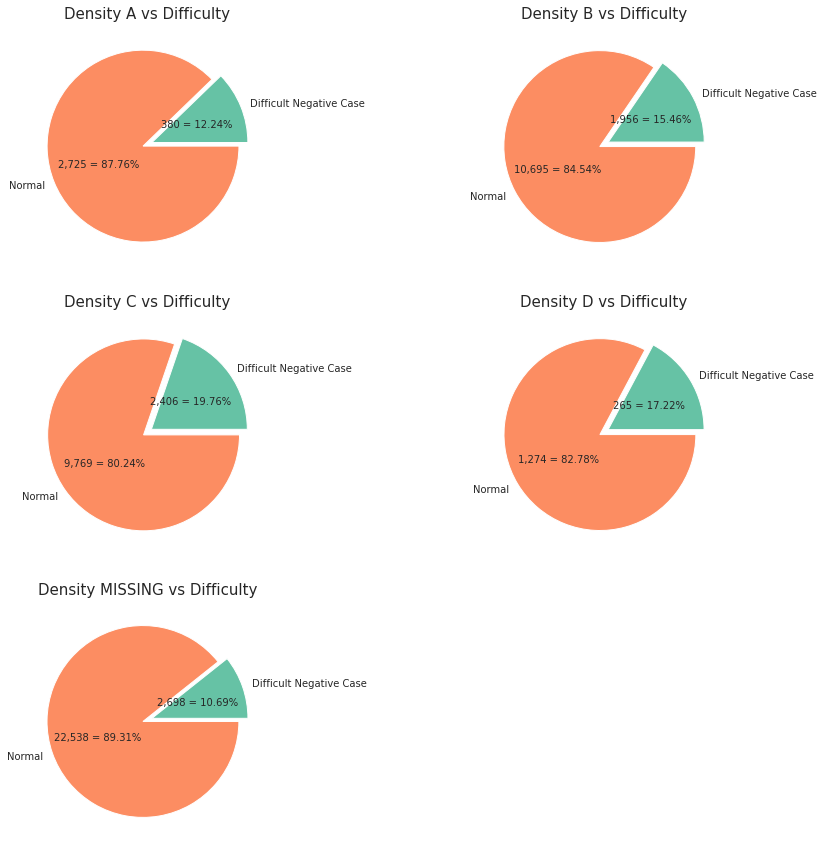

In [30]:
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

densities = ["A", "B", "C", "D", "MISSING"]
axs = axs.flatten()

train_subset = train.copy()
train_subset["density"] = train_subset["density"].fillna("MISSING")

for index, density in enumerate(densities):
    data = [
        train_subset[(train_subset["difficult_negative_case"] == 1) & (train_subset["density"] == density)]["image_id"].count(),
        train_subset[(train_subset["difficult_negative_case"] == 0) & (train_subset["density"] == density)]["image_id"].count()
    ]

    label = ["Difficult Negative Case", "Normal"]
    _ = axs[index].pie(
        data, labels=label,
        autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
        explode=[0.05] * 2, 
        pctdistance=0.5, 
        colors=sns.color_palette("Set2")[0:2],
    )
    _ = axs[index].set_title("Density {} vs Difficulty".format(density), fontsize=15)
    
_ = axs[5].axis("off")

No silver bullets here - difficult negative cases occur in the range of 10 - 20% depending on density. There is another avenue to explore however. Our dicom files had the features `CompressionForce` and `BodyPartThickness`. These two metrics may be able to provide us a density measurement if we don't have one in the training set. Let's check to see if we have these measurements in the dicoms when we are missing them in the training data.

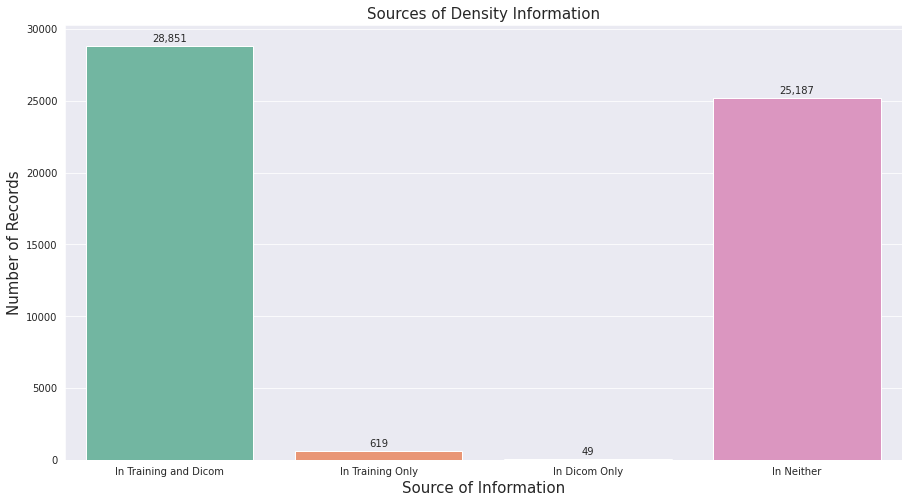

In [31]:
has_both = 0
has_training_only = 0
has_dicom_only = 0
has_neither = 0

train_subset = train.copy()
train_subset["density"] = train_subset["density"].fillna("MISSING")
dicom_subset = dicom_df.copy()
dicom_subset["CompressionForce"] = dicom_subset["CompressionForce"].fillna("MISSING")

for index, row in train_subset.iterrows():
    density = row["density"] != "MISSING"
    compression_force = dicom_subset.loc[index]["CompressionForce"] != "MISSING"
    if density and compression_force:
        has_both += 1
    if density and not compression_force:
        has_training_only += 1
    if not density and compression_force:
        has_dicom_only += 1
    if not density and not compression_force:
        has_neither += 1
        
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

x = ["In Training and Dicom", "In Training Only", "In Dicom Only", "In Neither"]
y = [has_both, has_training_only, has_dicom_only, has_neither]

_ = sns.barplot(x=x, y=y, ax=axs)
for p in axs.patches:
    axs.text(x=p.get_x()+(p.get_width()/2), y=p.get_height()+300, s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs.set_title("Sources of Density Information", fontsize=15)
_ = axs.set_ylabel("Number of Records", fontsize=15)
_ = axs.set_xlabel("Source of Information", fontsize=15)

Unfortunately, it looks like our dicom files will only provide an extra 49 records where density information was missing. Nearly half of the records are still missing density information. Given that `cancer` occurs with roughly the same frequency as different `density` groups, it is unlikely that density information will help.

As one final check, we should compare `density` to `BIRADS` and see if there is any strong correlations.

_In progress..._

### Key Observations About Density

* Overall, `density` appears to be missing in nearly half of the records in our test set.
    * While `CompressionForce` and `BodyPartThickness` appears in the dicom files, it appears most of that information overlaps with what we already have. So using it to fill in missing density information is not helpful.
    * It may be possible to tie `CompressionForce` and `BodyPartThickness` to specific `density` categories, however, given that `density` appear to be not strongly correlated with `cancer`, it will likely provide little predictive value.

# 3.5 - Implant Feature

The `implant` feature is a binary feature that signals whether a breast implant is present. We should check to see first if the presence of an implant significantly alters the incidence of a `cancer` finding.

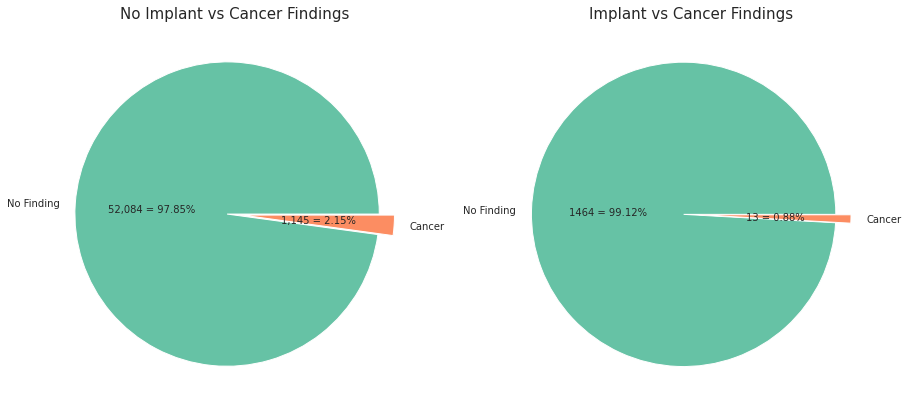

In [32]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

data = [
    train[(train["cancer"] == 0) & (train["implant"] == 0)]["image_id"].count(),
    train[(train["cancer"] == 1) & (train["implant"] == 0)]["image_id"].count(),
]
counts = pd.DataFrame()
_ = axs[0].pie(
    data, labels=["No Finding", "Cancer"],
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
    explode=[0.05] * 2, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:2],
)
_ = axs[0].set_title("No Implant vs Cancer Findings", fontsize=15)

data = [
    train[(train["cancer"] == 0) & (train["implant"] == 1)]["image_id"].count(),
    train[(train["cancer"] == 1) & (train["implant"] == 1)]["image_id"].count(),
]
counts = pd.DataFrame()
_ = axs[1].pie(
    data, labels=["No Finding", "Cancer"],
    autopct=lambda x: "{:.0f} = {:.2f}%".format(x * sum(data)/100, x) if x > 0 else "",
    explode=[0.05] * 2, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:2],
)
_ = axs[1].set_title("Implant vs Cancer Findings", fontsize=15)

This is rather an interesting finding. Of all the patients that had implants, only 13 were diagnosed with `cancer`. The difference between diagnosis rates between patients that do not have implants and those that do is skewed. With no implants, 2.15% of the population is diagnosed with `cancer`, while only 0.88% of the population with implants is diagnosed. Note that this doesn't mean that breast cancer doesn't occur at the same frequency in both groups, rather just that it is diagnosed more frequently in the population without implants. 

These results also speak to a rare case problem with patients with implants. Since only 13 instances of cancer were detected in patients with implants (a population size of 1,477), if a machine learning classifier could easily and accurately segment patients with implants from those that do not have implants, then you would be 99.12% accurate by concluding that any patient with an implant does not have `cancer`. While this is not good practice from a medical standpoint, from a machine learning perspective, this observation is rather important. If detecting cancer in patients with implants proves to be difficult, or if training a classifier on samples with implants decreases overall classifier performance on patients without implants, then it makes sense to see if the two populations can be segmented so that the implant data does not drag the final classifier accuracy down.

### Key Observations About Implant

* Patients who have breast implants are diagnosed with `cancer` at a much lower rate (0.88%) when compared with the population that does not have implants (2.15%). 
* Building a classifier that can segment the population into those patients that have implants versus those that do not may help in situations where adding implant data into the training pipeline results in a net decrease in accuracy for all populations. 

# 3.6 - Number of Images

While not a first order feature of the data, we should look at how many images are taken per patient, and whether that has an impact on the `cancer` finding.

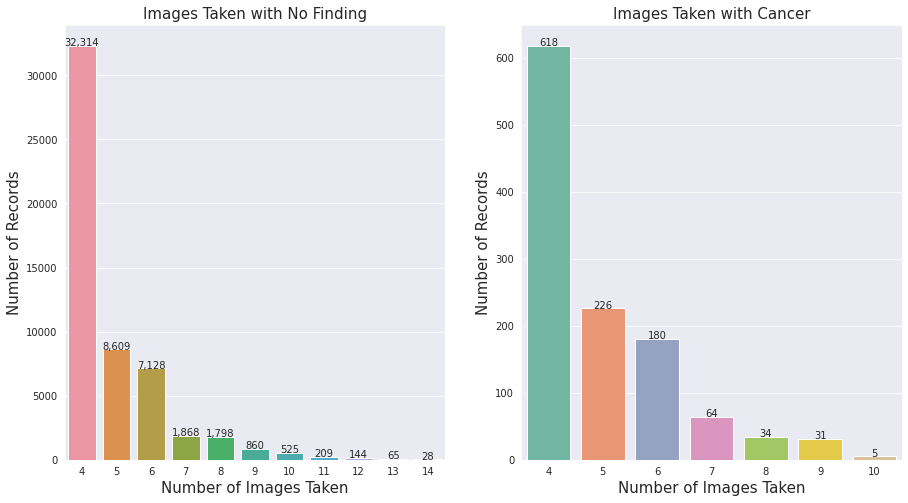

In [33]:
patient_dict = {}
for index, row in train.iterrows():
    patient_id = row["patient_id"]
    if patient_id not in patient_dict:
        patient_dict[patient_id] = 0
    patient_dict[patient_id] += 1
    
train["num_images"] = train["patient_id"].apply(lambda x: patient_dict[x])
train[(train["cancer"] == 1)]["num_images"].value_counts()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train[(train["cancer"] == 0)]["num_images"].value_counts())
_ = sns.barplot(x=counts.index, y=counts.num_images, ax=axs[0])
for p in axs[0].patches:
    axs[0].text(x=p.get_x()+(p.get_width()/2), y=p.get_height(), s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[0].set_title("Images Taken with No Finding", fontsize=15)
_ = axs[0].set_ylabel("Number of Records", fontsize=15)
_ = axs[0].set_xlabel("Number of Images Taken", fontsize=15)

counts = pd.DataFrame(train[(train["cancer"] == 1)]["num_images"].value_counts())
_ = sns.barplot(x=counts.index, y=counts.num_images, ax=axs[1])
for p in axs[1].patches:
    axs[1].text(x=p.get_x()+(p.get_width()/2), y=p.get_height(), s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[1].set_title("Images Taken with Cancer", fontsize=15)
_ = axs[1].set_ylabel("Number of Records", fontsize=15)
_ = axs[1].set_xlabel("Number of Images Taken", fontsize=15)

As shown above, if there are 11 or more images taken, then `cancer` is usually not found. Let's check these numbers with respect to `difficult_negative_cases`.

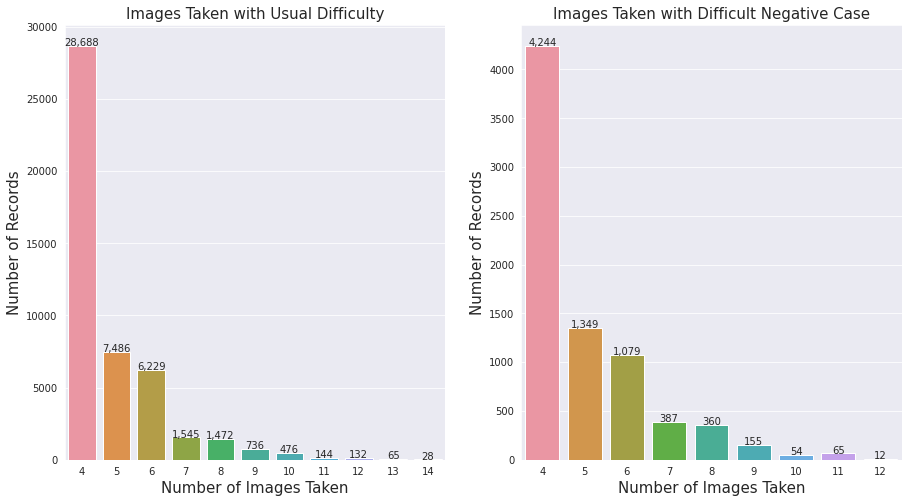

In [34]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train[(train["difficult_negative_case"] == False)]["num_images"].value_counts())
_ = sns.barplot(x=counts.index, y=counts.num_images, ax=axs[0])
for p in axs[0].patches:
    axs[0].text(x=p.get_x()+(p.get_width()/2), y=p.get_height(), s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[0].set_title("Images Taken with Usual Difficulty", fontsize=15)
_ = axs[0].set_ylabel("Number of Records", fontsize=15)
_ = axs[0].set_xlabel("Number of Images Taken", fontsize=15)

counts = pd.DataFrame(train[(train["difficult_negative_case"] == True)]["num_images"].value_counts())
_ = sns.barplot(x=counts.index, y=counts.num_images, ax=axs[1])
for p in axs[1].patches:
    axs[1].text(x=p.get_x()+(p.get_width()/2), y=p.get_height(), s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[1].set_title("Images Taken with Difficult Negative Case", fontsize=15)
_ = axs[1].set_ylabel("Number of Records", fontsize=15)
_ = axs[1].set_xlabel("Number of Images Taken", fontsize=15)

As we can see, there is no discernible difference between the number of images taken and whether the case difficulty was higher. Let's take a look at images taken with respect to the `implant` feature.

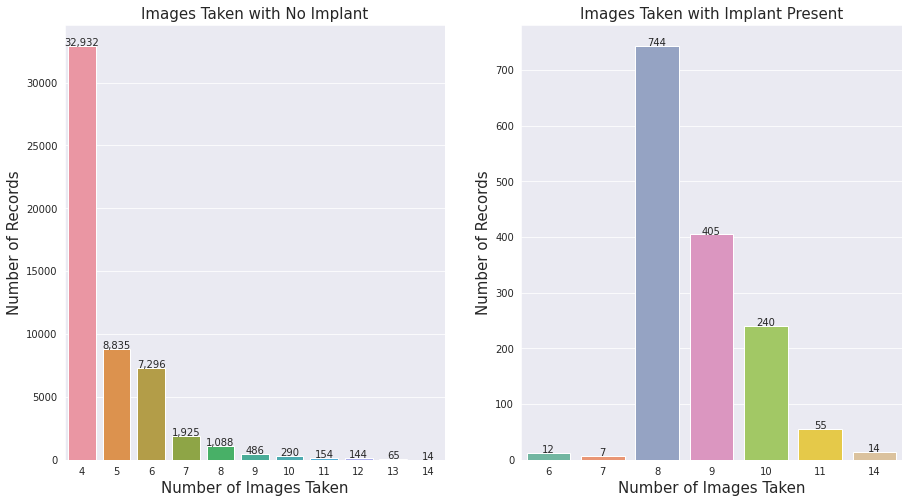

In [35]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

counts = pd.DataFrame(train[(train["implant"] == 0)]["num_images"].value_counts())
_ = sns.barplot(x=counts.index, y=counts.num_images, ax=axs[0])
for p in axs[0].patches:
    axs[0].text(x=p.get_x()+(p.get_width()/2), y=p.get_height(), s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[0].set_title("Images Taken with No Implant", fontsize=15)
_ = axs[0].set_ylabel("Number of Records", fontsize=15)
_ = axs[0].set_xlabel("Number of Images Taken", fontsize=15)

counts = pd.DataFrame(train[(train["implant"] == 1)]["num_images"].value_counts())
_ = sns.barplot(x=counts.index, y=counts.num_images, ax=axs[1])
for p in axs[1].patches:
    axs[1].text(x=p.get_x()+(p.get_width()/2), y=p.get_height(), s="{:,d}".format(round(p.get_height())), ha="center")
_ = axs[1].set_title("Images Taken with Implant Present", fontsize=15)
_ = axs[1].set_ylabel("Number of Records", fontsize=15)
_ = axs[1].set_xlabel("Number of Images Taken", fontsize=15)

Here we start to see signal with respect to the `implant` feature. Patients that have 8 or more images taken are very likely to have implants. Some reasoning why this may be the case is discussed in section 4.3 below.

### Key Findings for Number of Images

* There are between 4 and 14 images taken per patient.
* The most frequently taken number of images is 4, while the number of patients having 7 images or more drops significantly.
* Patients with implants are much more likely to have 8 or more images taken.
    * Given that patients with implants have a much lower rate of being diagnosed with cancer (0.88%), being able to identify those patients with implants would allow us to tweak the inductive bias of the classifier by setting the finding of `cancer` to 0. While this isn't a good idea from a medical standpoint, for the purposes of scoring high in the competition, this may provide additional classifier lift if there are many false positives being found with patients with implants, or if using implant images during training throws off the accuracy of a trained model.

# 4 Image Exploration

While this EDA has so far focused on the tabular portion of the available data, we should also examine the actual image data as well. 

# 4.1 - Anomalies Outside Area of Interest

We should begin by looking for anomalies that exist outside of the contoured area of interest. Visually speaking, we are only interested in the portion of the images relating to the breast tissue. Any other image artifacts outside of breast tissue could confuse or confound any of our machine learning models. We should check to see if there are any such anomalies and determine a method of filtering them out.

A quick visual scan reveals several. Here are some examples:

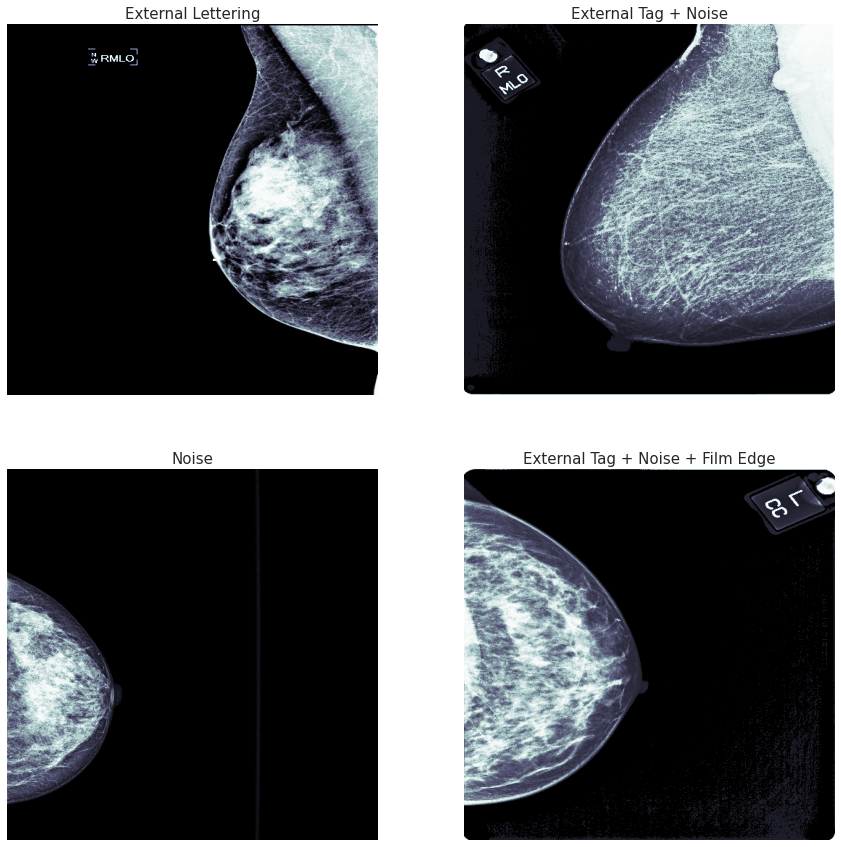

In [36]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

RESCALE_WIDTH = 512
RESCALE_HEIGHT = 512 

_ = axs[0].imshow(extract(58637, 3343518)[3], cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("External Lettering", fontsize=15)
_ = axs[1].imshow(extract(37851, 1494143)[3], cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("External Tag + Noise", fontsize=15)
_ = axs[2].imshow(extract(29941, 4830494)[3], cmap="bone")
_ = axs[2].axis("off")
_ = axs[2].set_title("Noise", fontsize=15)
_ = axs[3].imshow(extract(14995, 8964180)[3], cmap="bone")
_ = axs[3].axis("off")
_ = axs[3].set_title("External Tag + Noise + Film Edge", fontsize=15)

One way to deal with these external issues is to find the contours that delineate the actual breast image from background information, and then mask off areas outside of the breast tissue. One notebook that already provides a method of doing this using the OpenCV platform has been provided by [@davidbroberts](https://www.kaggle.com/davidbroberts) in their notebook: [Mammography - Remove Letter Markers](https://www.kaggle.com/code/davidbroberts/mammography-remove-letter-markers). That code has been reproduced below (but slightly modified to work with my image display functions). Here are the same images with the contour maps and masks applied.

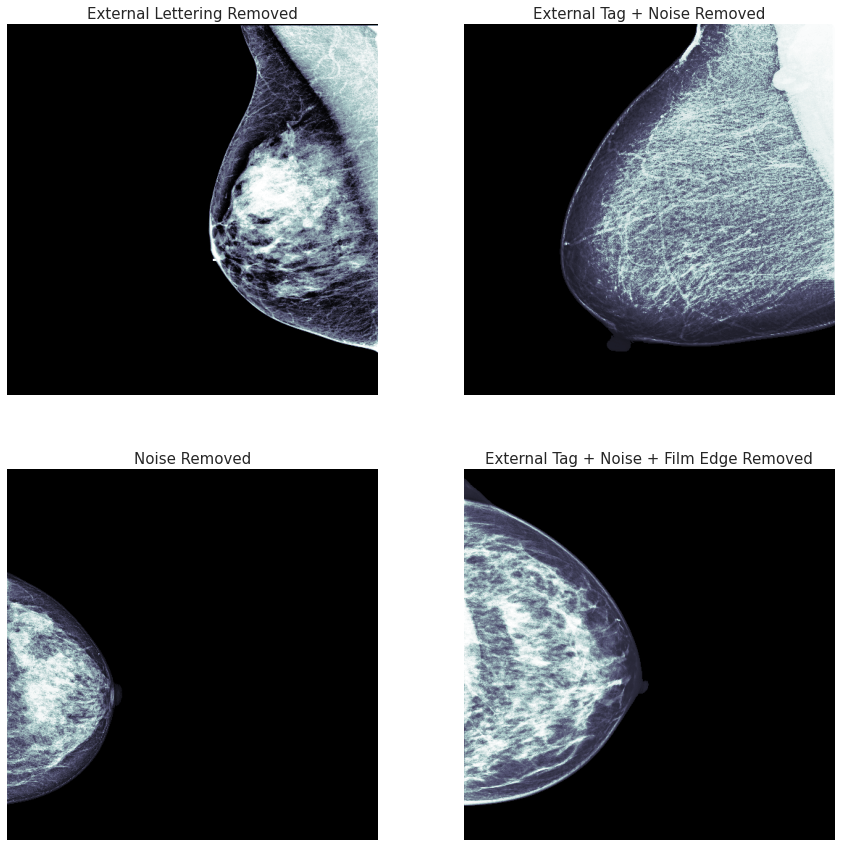

In [37]:
import cv2

def true_norm(img):
    norm = (img - np.min(img))
    norm = (norm / np.max(norm)) * 255
    return norm.astype(np.uint8)

def mask_external_contour(pixels):
    contours, _ = cv2.findContours(pixels, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    contour = max(contours, key=cv2.contourArea)
    mask = np.zeros(pixels.shape, np.uint8)
    cv2.drawContours(mask, [contour], -1, 255, cv2.FILLED)
    return cv2.bitwise_and(pixels, mask)

def get_clean_image(patient_id, image_id):
    return mask_external_contour(true_norm(extract(patient_id, image_id)[3]))

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

RESCALE_WIDTH = 512
RESCALE_HEIGHT = 512 

_ = axs[0].imshow(get_clean_image(58637, 3343518), cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("External Lettering Removed", fontsize=15)
_ = axs[1].imshow(get_clean_image(37851, 1494143), cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("External Tag + Noise Removed", fontsize=15)
_ = axs[2].imshow(get_clean_image(29941, 4830494), cmap="bone")
_ = axs[2].axis("off")
_ = axs[2].set_title("Noise Removed", fontsize=15)
_ = axs[3].imshow(get_clean_image(14995, 8964180), cmap="bone")
_ = axs[3].axis("off")
_ = axs[3].set_title("External Tag + Noise + Film Edge Removed", fontsize=15)

Some care may need to be exercised with some images, as several contours may be present, and the code sample only saves the largest one. This may not be idea in some extreme circumstances. For example:

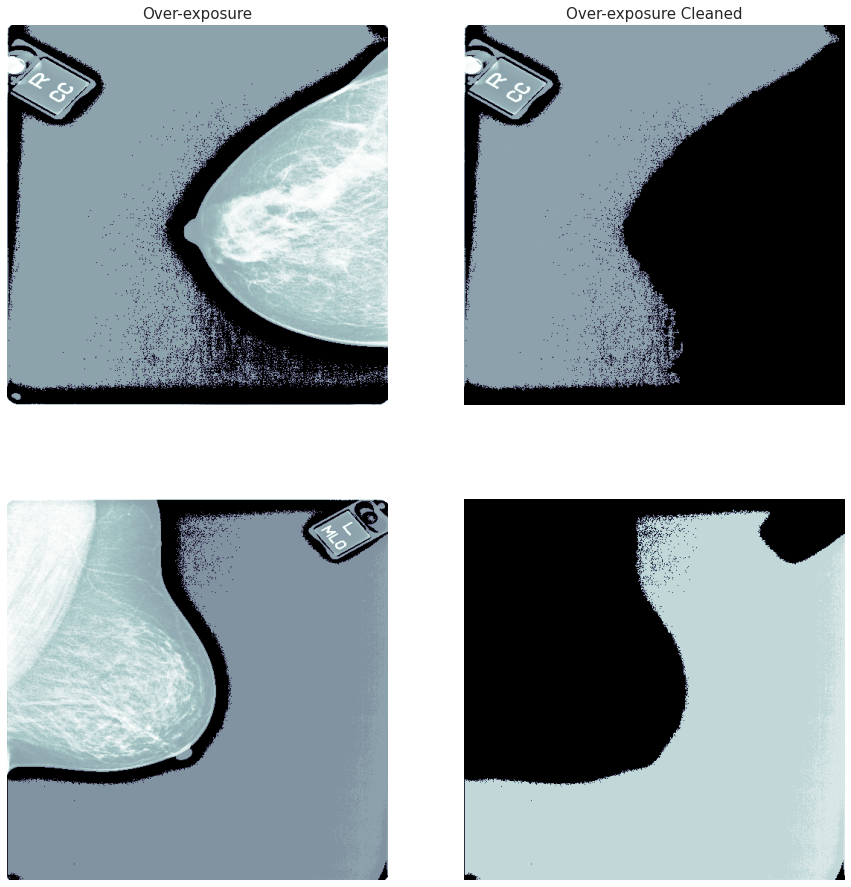

In [38]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 16))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

_ = axs[0].imshow(extract(59724, 68772829)[3], cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("Over-exposure", fontsize=15)
_ = axs[1].imshow(get_clean_image(59724, 68772829), cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("Over-exposure Cleaned", fontsize=15)
_ = axs[2].imshow(extract(56434, 72895575)[3], cmap="bone")
_ = axs[2].axis("off")
_ = axs[2].set_title("", fontsize=15)
_ = axs[3].imshow(get_clean_image(56434, 72895575), cmap="bone")
_ = axs[3].axis("off")
_ = axs[3].set_title("", fontsize=15)

In this instance, the contour area selected was the largest area available, but due to the background noise, that contour happens to take up the portion of the image that we don't want to look at. One way around this is to examine the size of the area selected by the contour. In the majority of the slides, the actual tissue area is much smaller than the total area of the complete image. So, as a double check that the correct portion of the image was selected, we can simply draw a bounding box around the contour that was generated, and measure how large an area it takes up. We can then select the portion of the image that was not contained in the contour, and draw a new contour around it. We then take the contoured area that is the smaller of the two, as long as the contour area takes up somewhere around 20% of the complete area of the slide. Below is a simple algorithm that does this, with the resulting images that it displays.

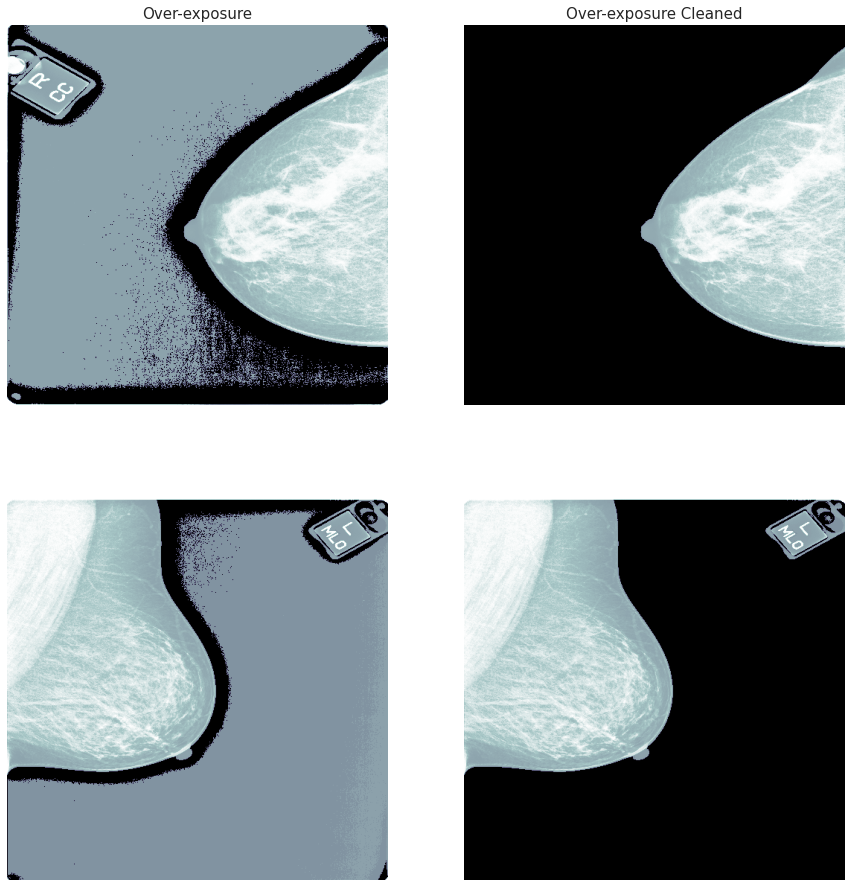

In [39]:
def mask_external_contour_new(img):
    # Find the biggest contour and calculate size of bounding box that encapsulates it
    img_copy1 = img.copy()
    contours, _ = cv2.findContours(img_copy1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    contour = max(contours, key=cv2.contourArea)
    mask = np.zeros(img_copy1.shape, np.uint8)
    cv2.drawContours(mask, [contour], -1, 255, cv2.FILLED)
    cv2.bitwise_and(img_copy1, mask, img_copy1)
    _, _, rect1_width, rect1_height = cv2.boundingRect(contour)
    
    # Select the area not covered by the contour by masked off the contoured area
    img_copy2 = img.copy()
    mask = np.empty(img_copy2.shape, dtype=np.uint8)
    mask.fill(255)
    cv2.drawContours(mask, [contour], -1, 0, cv2.FILLED)
    cv2.bitwise_and(img_copy2, mask, img_copy2)
    
    # Now find the largest contour in the side that wasn't masked off
    contours, _ = cv2.findContours(img_copy2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    # If we can't find one, then just return the previously found image
    try:
        contour = max(contours, key=cv2.contourArea)
    except Exception:
        return img_copy1
    
    # Generate a new mask for the other side of the image
    mask = np.zeros(img_copy2.shape, np.uint8)
    cv2.drawContours(mask, [contour], -1, 255, cv2.FILLED)
    cv2.bitwise_and(img_copy2, mask, img_copy2)
    
    # Compare rectangle sizes
    _, _, rect2_width, rect2_height = cv2.boundingRect(contour)
    rect1_area = rect1_width * rect1_height
    rect2_area = rect2_width * rect2_height
    rect1_area_pct = rect1_area / (RESCALE_WIDTH * RESCALE_HEIGHT)
    rect2_area_pct = rect2_area / (RESCALE_WIDTH * RESCALE_HEIGHT)
    
    # Return the smallest bounded image
    if rect1_area < rect2_area:
        return img_copy1
    
    # But make sure the smallest bounded image is still a significant size
    if rect2_area_pct > 0.20:
        return img_copy2
    
    return img_copy1

def get_clean_image_new(patient_id, image_id):
    return mask_external_contour_new(true_norm(extract(patient_id, image_id)[3]))

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 16))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

_ = axs[0].imshow(extract(59724, 68772829)[3], cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("Over-exposure", fontsize=15)
_ = axs[1].imshow(get_clean_image_new(59724, 68772829), cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("Over-exposure Cleaned", fontsize=15)
_ = axs[2].imshow(extract(56434, 72895575)[3], cmap="bone")
_ = axs[2].axis("off")
_ = axs[2].set_title("", fontsize=15)
_ = axs[3].imshow(get_clean_image_new(56434, 72895575), cmap="bone")
_ = axs[3].axis("off")
_ = axs[3].set_title("", fontsize=15)

This still isn't perfect, as the bottom image now retains the tag, which is what we wanted to remove. However, the benefit of this approach is that it doesn't require a separate trained model to identify the area of interest. Future work could be done here to adjust the threshold value of what should be considered part of a connected contour, however, it is likely that there isn't going to be a one size fits all solution with that approach.

### Key Observations About External Anomalies

* Tags, noise, and other image artifacts may exist outside of the breast tissue areas. Thanks to some work done by [@davidbroberts](https://www.kaggle.com/davidbroberts) in their notebook [Mammography - Remove Letter Markers](https://www.kaggle.com/code/davidbroberts/mammography-remove-letter-markers), we can filter most of that out. However, certain edge cases still exist where the incorrect mask is applied to the image, resulting in the breast tissue being masked out. While these appear to occur fairly infrequently, a more robust method of pre-processing may be needed.

# 4.2 - Internal Anomalies - Circular Markers

Several of the images appear to have internal markup already. The first anomaly appears as circled locations. Here are some examples:

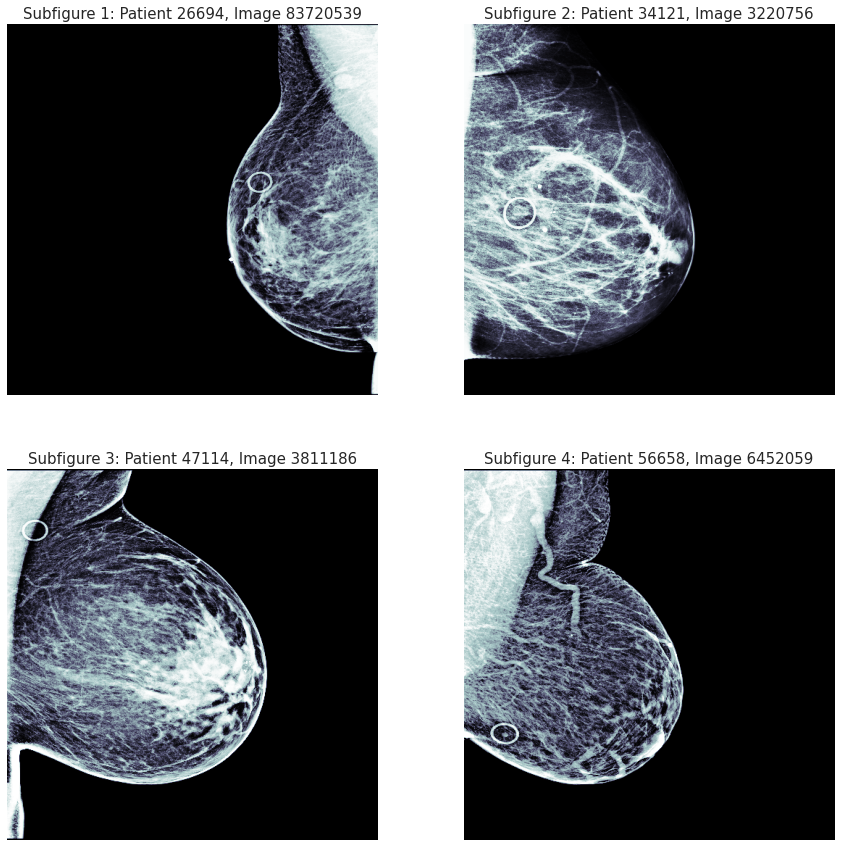

In [40]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

_ = axs[0].imshow(get_clean_image(26694, 83720539), cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("Subfigure 1: Patient 26694, Image 83720539", fontsize=15)
_ = axs[1].imshow(get_clean_image(34121, 3220756), cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("Subfigure 2: Patient 34121, Image 3220756", fontsize=15)
_ = axs[2].imshow(get_clean_image(47114, 3811186), cmap="bone")
_ = axs[2].axis("off")
_ = axs[2].set_title("Subfigure 3: Patient 47114, Image 3811186", fontsize=15)
_ = axs[3].imshow(get_clean_image(56658, 6452059), cmap="bone")
_ = axs[3].axis("off")
_ = axs[3].set_title("Subfigure 4: Patient 56658, Image 6452059", fontsize=15)

It's worth checking the tabular data to see if there is anything regarding `cancer` or any other indicators that something abnormal was present. Let's look at all of the patients in question.

In [41]:
train[(train["image_id"] == 83720539) | (train["image_id"] == 3220756) | (train["image_id"] == 3811186) | (train["image_id"] == 6452059)]

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case,null_count,num_images
15686,1,26694,83720539,R,MLO,32.0,0,0,0,2.0,0,B,49,False,0,4
22671,1,34121,3220756,L,MLO,56.0,0,0,0,1.0,0,B,216,False,0,6
34610,1,47114,3811186,R,MLO,41.0,0,0,0,1.0,0,C,49,False,0,6
43326,1,56658,6452059,L,MLO,50.0,0,0,0,1.0,0,A,49,False,0,6


While the circles look to be highlighting something important, in all instances in the tabular data, `cancer` is not present. The patient in subfigure 1 has a `BIRADS` score of 2, meaning that the image was normal, but there was a mass present. Potentially this mass is contained within the circled area, although it is difficult to make out. However, for the other patients in subfigures 2 - 4, the `BIRADS` scores are 1, meaning that there were normal results with no abnormal masses detected. Why are there circles on these images? Let's take a look at the tabular data for subfigure 4 patient information, and more generally, let's look at the totality of the views that are available.

In [42]:
train[(train["patient_id"] == 56658)]

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case,null_count,num_images
43326,1,56658,6452059,L,MLO,50.0,0,0,0,1.0,0,A,49,False,0,6
43327,1,56658,402536310,L,CC,50.0,0,0,0,1.0,0,A,49,False,0,6
43328,1,56658,1510335319,L,CC,50.0,0,0,0,1.0,0,A,49,False,0,6
43329,1,56658,712856730,R,MLO,50.0,0,0,0,1.0,0,A,49,False,0,6
43330,1,56658,806946410,R,CC,50.0,0,0,0,1.0,0,A,49,False,0,6
43331,1,56658,868474213,R,MLO,50.0,0,0,0,1.0,0,A,49,False,0,6


We can see that there were a total of 6 images taken, three for the right and three for the left. None have a finding for `cancer`, and none have `BIRADS` indicative of any abnormalities. Let's pull up all of the patient's imaging on the left hand side and compare them.

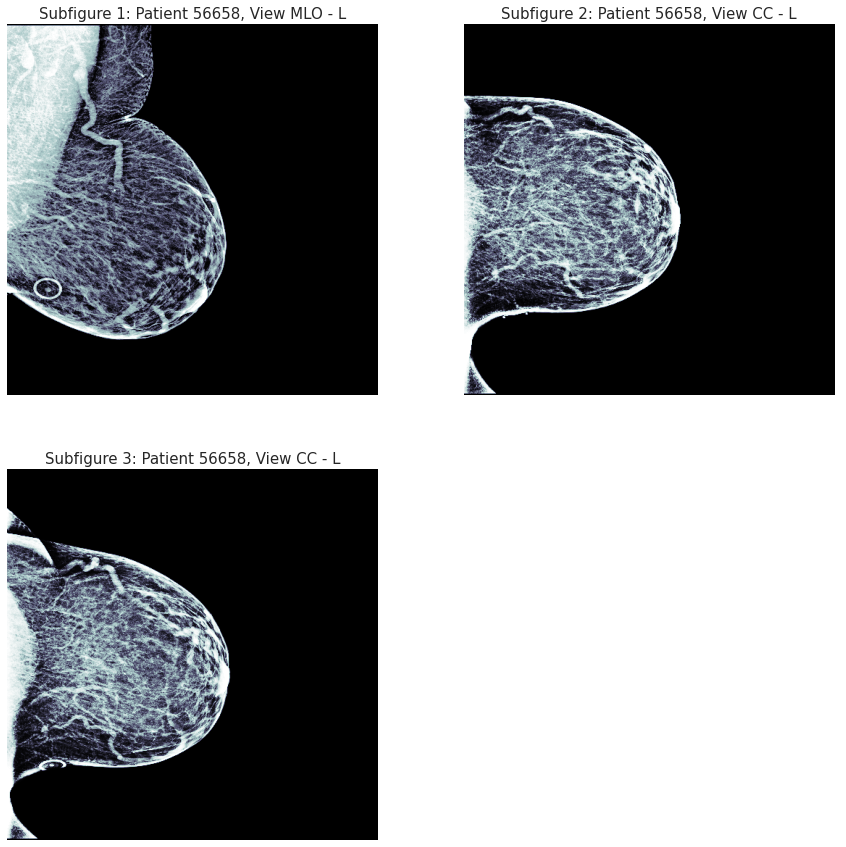

In [43]:
patient_slice = pd.DataFrame(train[(train["patient_id"] == 56658) & (train["laterality"] == "L")])

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()
counter = 0

for index, row in patient_slice.iterrows():
    _ = axs[counter].imshow(get_clean_image(row["patient_id"], row["image_id"]), cmap="bone")
    _ = axs[counter].axis("off")
    _ = axs[counter].set_title("Subfigure {}: Patient {}, View {} - {}".format(counter+1, row["patient_id"], row["view"], row["laterality"]), fontsize=15)
    counter += 1
_ = axs[3].axis("off")

In subfigure 3 above, the circle is again present, although now looks as if it is a physical feature that is actually on top of the skin. The oval boundaries can be made out in subfigure 2. Let's take a look at one of our other examples to see if it appears to be similar in nature.

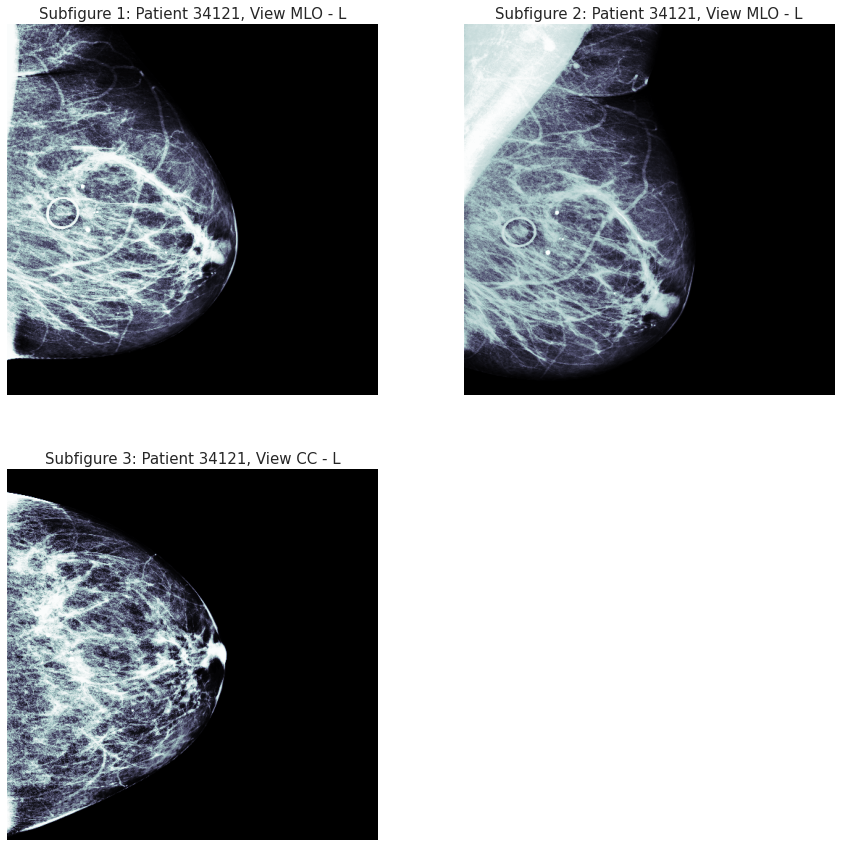

In [44]:
patient_slice = pd.DataFrame(train[(train["patient_id"] == 34121) & (train["laterality"] == "L")])

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()
counter = 0

for index, row in patient_slice.iterrows():
    _ = axs[counter].imshow(get_clean_image(row["patient_id"], row["image_id"]), cmap="bone")
    _ = axs[counter].axis("off")
    _ = axs[counter].set_title("Subfigure {}: Patient {}, View {} - {}".format(counter+1, row["patient_id"], row["view"], row["laterality"]), fontsize=15)
    counter += 1
_ = axs[3].axis("off")

In subfigures 1 and 2, we can see circles around a mass that looks to be a point of interest, but no circle appears in subfigure 3, where the mass is not visible. Let's take a look at our final example.

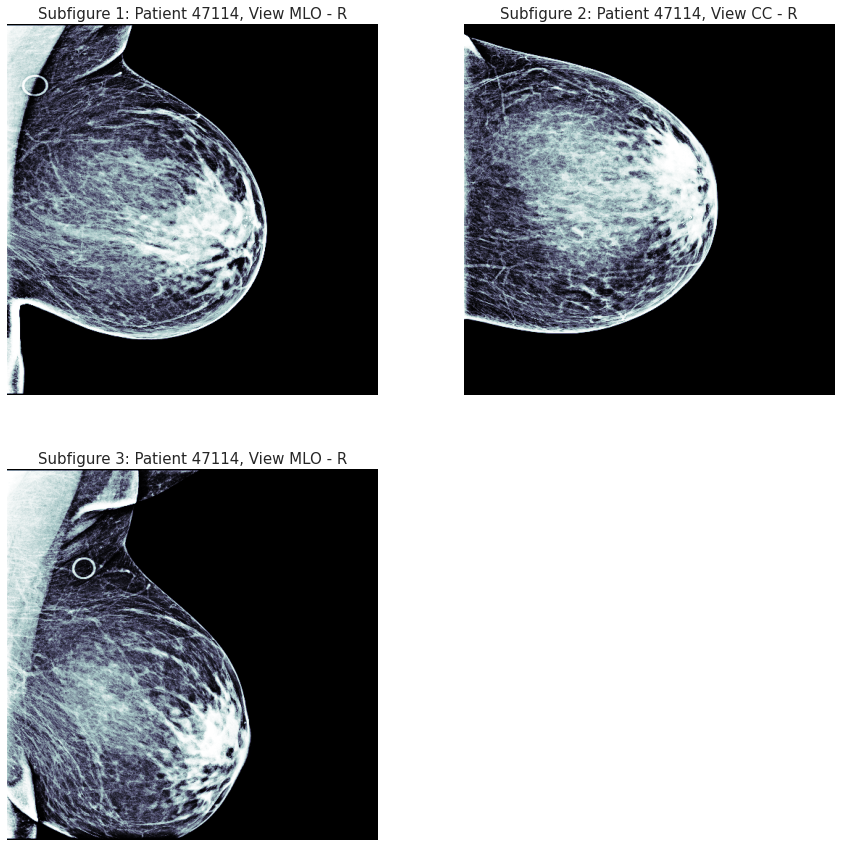

In [45]:
patient_slice = pd.DataFrame(train[(train["patient_id"] == 47114) & (train["laterality"] == "R")])

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()
counter = 0

for index, row in patient_slice.iterrows():
    _ = axs[counter].imshow(get_clean_image(row["patient_id"], row["image_id"]), cmap="bone")
    _ = axs[counter].axis("off")
    _ = axs[counter].set_title("Subfigure {}: Patient {}, View {} - {}".format(counter+1, row["patient_id"], row["view"], row["laterality"]), fontsize=15)
    counter += 1
_ = axs[3].axis("off")

Again, circles are present in subfigures 1 and 3, but not in subfigure 2. Based on how the circles are appearing, it is quite possible that these are points of interest being highlighted by a technician in an attempt to flag suspicious areas for further review. 

We should check and see if the circles appear in images that have a cancer diagnosis. A visual inspection of all 1,158 `cancer` records shows that 95 records contains circles. The following `patient_id`, `image_id` pairs represent the images in the `cancer` positive group.

* 11919, 1007401721
* 11919, 1017363921
* 11937, 1767654639
* 12195, 91797551
* 12195, 100147863
* 14706, 180902452
* 14706, 1060299310
* 15078, 728564060
* 15078, 1167308429
* 15078, 1719011144
* 16145, 146978545
* 16145, 1226471466
* 1878, 1490758028
* 1878, 1609298443
* 19486, 583119542
* 19486, 886797800
* 19486, 1749776218
* 20009, 936994890
* 21880, 880971379
* 21880, 2124340393
* 22562, 184187010
* 22562, 1512279672
* 25523, 449544592
* 25523, 690750133
* 25523, 1384710229
* 25895, 204685133
* 25895, 1519814432
* 26700, 88710137
* 26700, 400752214
* 26700, 476723525
* 26700, 1878879697
* 28344, 1372132287
* 28344, 1940528865
* 28344, 2037343606
* 28634, 1562558660
* 28634, 1961468653
* 28785, 216760793
* 28785, 827818239
* 31582, 240230808
* 31582, 435931040
* 31582, 564250417
* 32740, 1816420208
* 33971, 513700051
* 33971, 1445458891
* 34962, 1766220026
* 36034, 311083578
* 36034, 810135280
* 37931, 1225495210
* 37931, 1597761099
* 37931, 1892232224
* 39401, 253372914
* 40774, 1246979925
* 40774, 2078895538
* 40774, 2119129069
* 41238, 899283143
* 42160, 684267184
* 42160, 1496104302
* 43004, 1829769663
* 43004, 2054900584
* 45441, 809904326
* 45441, 1235507527
* 48368, 874812410
* 48368, 1464175162
* 49954, 728779079
* 49954, 1797342487
* 51697, 614234167
* 51697, 1244710301
* 51697, 1361957686
* 53659, 159940212
* 53659, 297086361
* 53659, 1125098485
* 54463, 385806898
* 54463, 1345167254
* 57229, 1863446
* 57229, 783906176
* 57229, 1874344878
* 5878, 275934305
* 5911, 1491483248
* 59806, 705873233
* 59806, 1938538147
* 59806, 2119940867
* 59865, 835658415
* 59865, 1213747044
* 60629, 306442803
* 63056, 217140431
* 63056, 1783998558
* 63056, 1932489777
* 64385, 138963357
* 64385, 371176944
* 64385, 1032681733
* 64534, 453797042
* 64534, 1420658905
* 64534, 1551728826
* 65077, 545603591
* 7780, 132778066

Let's take a look to see how this impacts the `cancer` group.

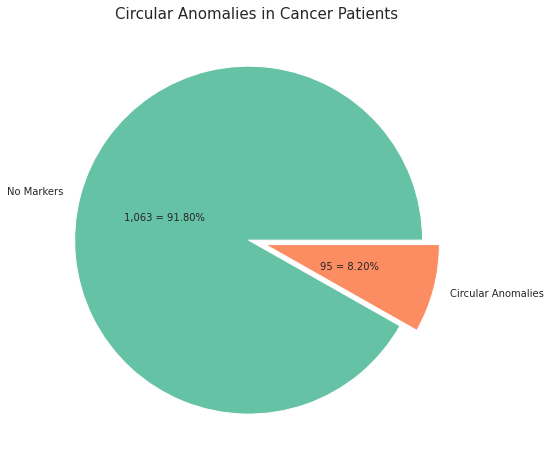

In [46]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(15, 8))

sns.set_style('darkgrid')
sns.set_palette('Set2')

data = [1063, 95]
counts = pd.DataFrame()
_ = axs.pie(
    data, labels=["No Markers", "Circular Anomalies"],
    autopct=lambda x: "{:,.0f} = {:.2f}%".format(x * sum(data)/100, x),
    explode=[0.05] * 2, 
    pctdistance=0.5, 
    colors=sns.color_palette("Set2")[0:2],
)
_ = axs.set_title("Circular Anomalies in Cancer Patients", fontsize=15)

As seen, about 8% of the cancer records available have circular anomalies. Unfortunately, short of examining more than 54,000 images, we don't know what the prevalence of the anomalies is in the rest of the dataset. We may need to add additional training samples with circular anomalies added to them to prevent the machine learning classifier from placing too much emphasis on their existence.

### Key Observations About Circular Markers

* Markers may be due to a technician flagging certain areas for further examination.
* The markers may or may not be associated with instances of `cancer`, which may confound a machine learning algorithm as they themselves are highly anomalous in nature when compared to breast tissue, and are quite easy to spot. 
* Markers may appear on one or more images for a patient. Depending on the angle and density of tissue, the markers may not be present at all.

# 4.3 - Imagery with Implants

We should also check to see if the presence of implants has an impact on the imagery available.

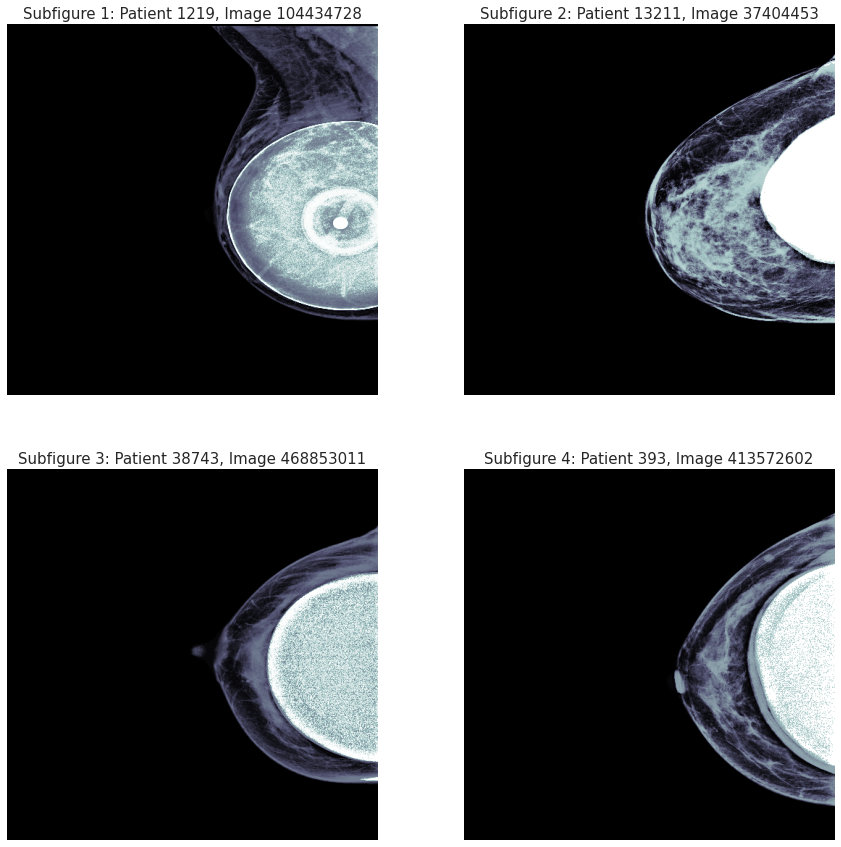

In [47]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

_ = axs[0].imshow(get_clean_image(1219, 104434728), cmap="bone")
_ = axs[0].axis("off")
_ = axs[0].set_title("Subfigure 1: Patient 1219, Image 104434728", fontsize=15)
_ = axs[1].imshow(get_clean_image(13211, 37404453), cmap="bone")
_ = axs[1].axis("off")
_ = axs[1].set_title("Subfigure 2: Patient 13211, Image 37404453", fontsize=15)
_ = axs[2].imshow(get_clean_image(38743, 468853011), cmap="bone")
_ = axs[2].axis("off")
_ = axs[2].set_title("Subfigure 3: Patient 38743, Image 468853011", fontsize=15)
_ = axs[3].imshow(get_clean_image(393, 413572602), cmap="bone")
_ = axs[3].axis("off")
_ = axs[3].set_title("Subfigure 4: Patient 393, Image 413572602", fontsize=15)

From a purely qualitative standpoint, it appears the presence of implants may challenge the performance of a classifier. Implants are _radiopaque_ meaning that they occlude the x-rays being used to generate the mammogram. In turn, this makes seeing the actual breast tissue much more difficult. Certainly in the views above, this may represent a significant challenge. Let's see if the same problem is prevalent in all the views available.

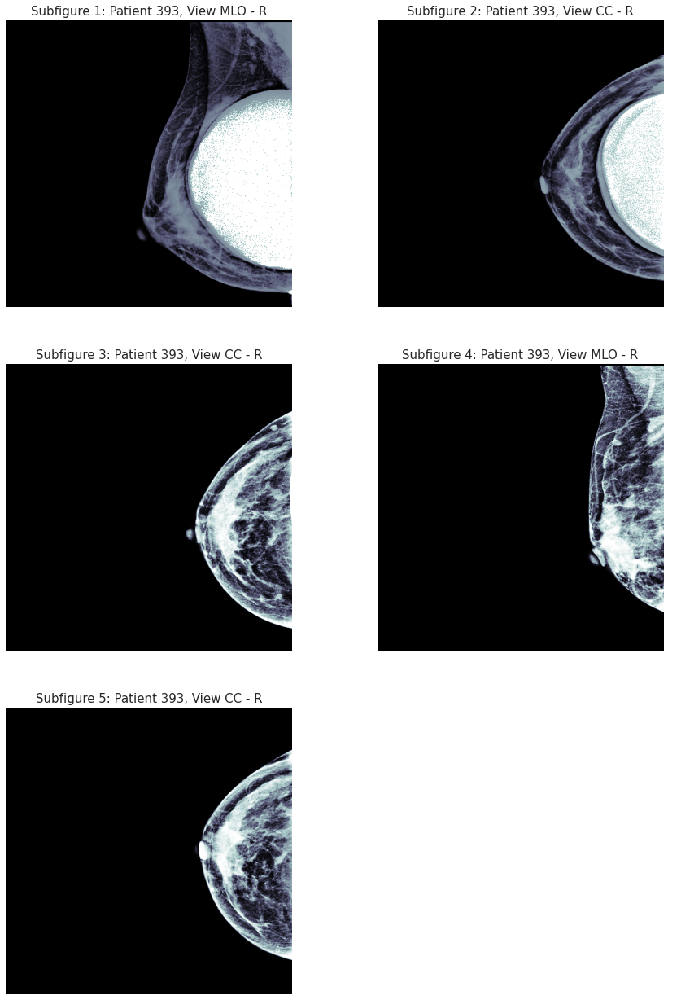

In [48]:
patient_slice = pd.DataFrame(train[(train["patient_id"] == 393) & (train["laterality"] == "R")])

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 22))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()
counter = 0

for index, row in patient_slice.iterrows():
    _ = axs[counter].imshow(get_clean_image(row["patient_id"], row["image_id"]), cmap="bone")
    _ = axs[counter].axis("off")
    _ = axs[counter].set_title("Subfigure {}: Patient {}, View {} - {}".format(counter+1, row["patient_id"], row["view"], row["laterality"]), fontsize=15)
    counter += 1
_ = axs[5].axis("off")

As can be seen in subfigures 1 and 2, the implant is occluding the view of the breast tissue, while subfigures 3, 4, and 5 of the same patient do not have the same occlusions. This could be due to an imaging series being done before and after an implant surgery. However, it is more likely that the technician performing the mammogram is performing an _implant displacement_, where the implant is gently pushed back against the chest wall, and the breast tissue is moved forward (Couto _et al._, 2022). The need to displace the implant is very likely the cause of the increased number of images taken, as discussed in section 3.6 when the number of images was examined as a feature itself.

### Key Observations About Imagery with Implants

* Breast implants are radiopaque and make it difficult to see underlying breast tissue.
* Techniques such as implant displacement make it possible to take pictures of breast tissue by moving the implant to the chest wall. More images are taken when images are present, likely due to the need of performing the displacement technique for clearer images.
* The images of a patient may contain a mixture of those with implants clearly visible, and those without. 
* We should be aware that implants may introduce noise into our image classifier. Consider removing views with implants from the training set, or developing a soft-label to classify the presence of implants first so that images with significant occlusions due to implants do not unnecessarily impact classifier performance.

# 4.4 - Horizontal Image Inversions

We have already seen instances of image inversion already. To explain a bit more, each record has a `laterality` that describes what side the image represents. We would expect that a `L` or left laterality would present on one side of the image, and that `R` or right laterality would present on the other side. Let's take a look at some images at random and examine if this holds true in the testing images we have been given.

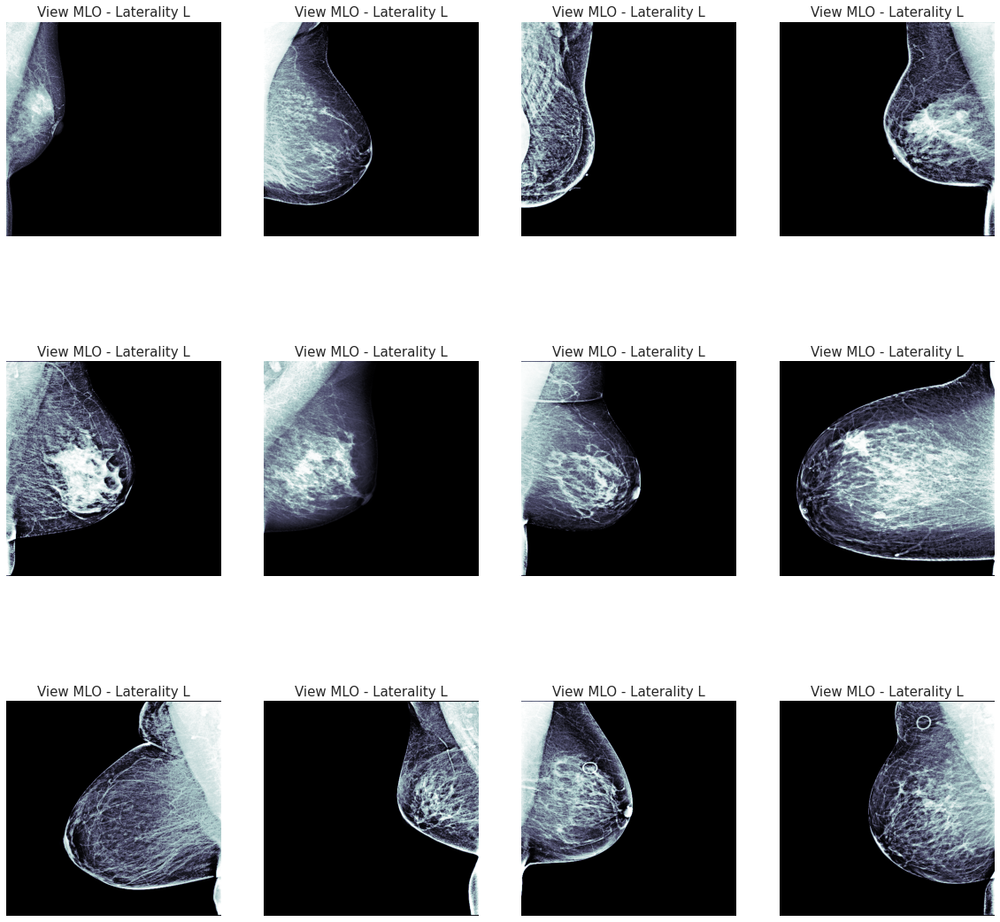

In [49]:
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(20, 20))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

count = 0
skip_count = 100
skip = False

for index, row in train[(train["laterality"] == "L") & (train["view"] == "MLO")].iterrows():
    if skip == 0:
        skip = 100
        _ = axs[count].imshow(get_clean_image(row["patient_id"], row["image_id"]), cmap="bone")
        _ = axs[count].axis("off")
        _ = axs[count].set_title("View {} - Laterality {}".format(row["view"], row["laterality"]), fontsize=15)
        count += 1
        if count > 11:
            break
    else:
        skip -= 1

We can see that although we are looking at a `laterality` of `L` with the `view` of `MLO`, we have imaging that has the chest wall on both the right and left hand side of the image. While we could normalize each `L` and `R` to their respective sides, it would be more worthwhile to orient all of the images the same way. The reasoning for this step is that we probably want to start creating a standard / normalized view of each image. To do that, we'll orient our images such that the chest wall will be on the left hand side of the image. 

A simple method to ensure each image is oriented the way we want is simply to find the center line in our existing image, and use Python's Numpy to slice the image array in half. Then, we'll mask out each pixel such that it is zero or one (on or off), and then sum the arrays. If the right hand array has more pixels on when compared to the left, then we use OpenCV to flip the image. Here is how the images above look when we apply this method.

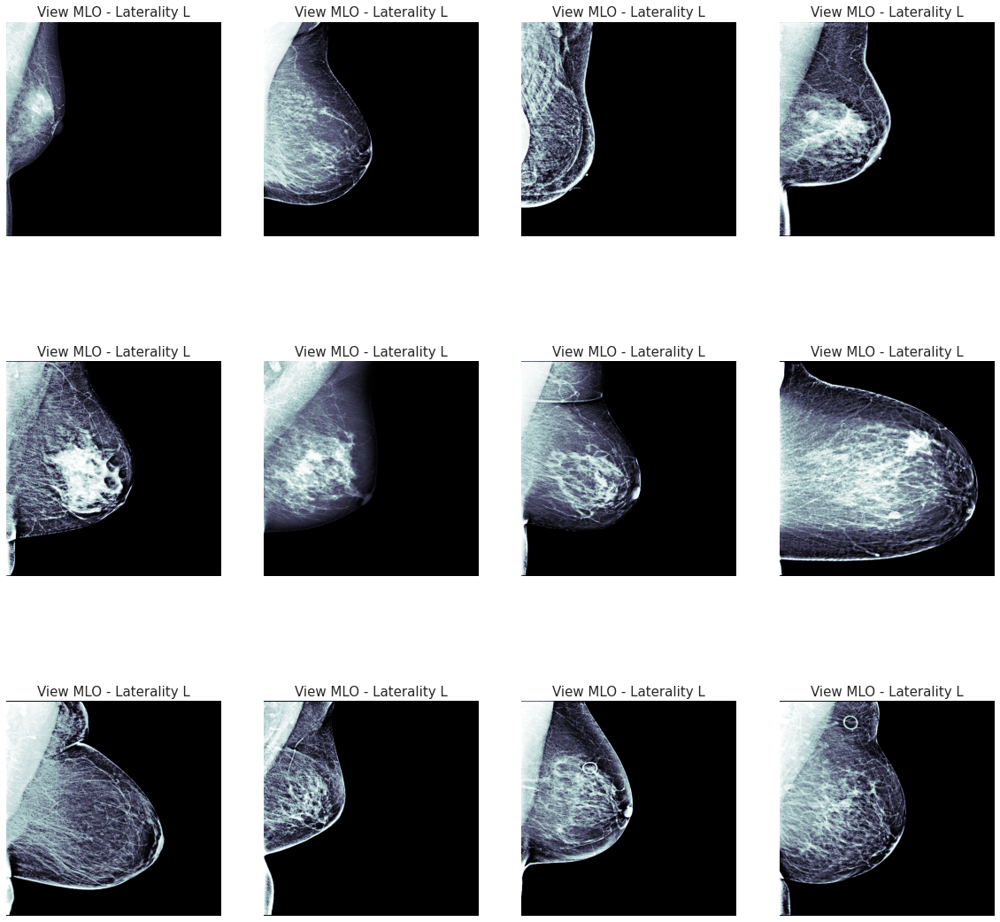

In [50]:
def slice_image(img):
    _, width = img.shape
    new_width = int(width / 2)
    left_img = img[:, 0:new_width]
    right_img = img[:, new_width:]
    return left_img, right_img

def mask_pixels(img):
    img[img > 1] = 1
    return img

def count_pixels(img):
    return np.sum(img)

def normalize_horiz_orientation(img):
    left_img, right_img = slice_image(mask_pixels(img.copy()))
    if count_pixels(right_img) > count_pixels(left_img):
        return cv2.flip(img, 1)
    return img

fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(20, 20))

sns.set_style('darkgrid')
sns.set_palette('Set2')

axs = axs.flatten()

count = 0
skip_count = 100
skip = False

for index, row in train[(train["laterality"] == "L") & (train["view"] == "MLO")].iterrows():
    if skip == 0:
        skip = 100
        _ = axs[count].imshow(normalize_horiz_orientation(get_clean_image(row["patient_id"], row["image_id"])), cmap="bone")
        _ = axs[count].axis("off")
        _ = axs[count].set_title("View {} - Laterality {}".format(row["view"], row["laterality"]), fontsize=15)
        count += 1
        if count > 11:
            break
    else:
        skip -= 1

### Key Observations About Horizontal Image Inversions

* Image `laterality` is not standardized for `L` and `R` with respect to what side of the image the chest wall appears on.
* We probably should normalize all of our images to some standard orientation so that our machine learning algorithms have landmarks in roughly the same locations.

# More to Come...

# References 

* Couto, L. S., Freitas-Junior, R., Corrêa, R. S., Lauar, M. V., Bauab, S. P., Urban, L. A. B. D., Cruvinel-Filho, J. L. O., Soares, L. R., & Savaris, R. F. (2022). Are All Views with and without Displacement Maneuver Necessary in Augmentation Mammography? Putting Numbers Into Perspective. Asian Pacific journal of cancer prevention : APJCP, 23(1), 233–239. [https://doi.org/10.31557/APJCP.2022.23.1.233](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9258642/)
* Pesce, K., Orruma, M. B., Hadad, C., Bermúdez Cano, Y., Secco, R., & Cernadas, A. (2019). BI-RADS Terminology for Mammography Reports: What Residents Need to Know. RadioGraphics, 39(2), 319–320. [https://doi.org/10.1148/rg.2019180068](https://pubs.rsna.org/doi/full/10.1148/rg.2019180068)